# 0. Smoke Test (check dataset paths)

In [1]:
import os
import sys

# --- Ensure project root ---
project_root = os.path.abspath(os.path.join(os.getcwd()))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

print("Project root set to:", project_root)

# --- Import loader ---
from src.config.loader import load_cfg

# Load config.yaml
cfg = load_cfg("config.yaml")

# --- Dataset inspection ---
print("\nChecking dataset paths:")
for k, v in vars(cfg.paths).items():  # vars() works cleanly with SimpleNamespace
    if isinstance(v, str):
        print(f"{k:25} -> {os.path.exists(v)}")
        

Project root set to: c:\Users\Jonathan Morel\Desktop\Honour

Checking dataset paths:
root                      -> True
grading_images            -> True
grading_images_train      -> True
grading_images_test       -> True
grading_labels            -> True
grading_labels_train      -> True
grading_labels_test       -> True
segmentation_images       -> True
segmentation_images_train -> True
segmentation_images_test  -> True
masks_root                -> True
localization_images       -> True
localization_images_train -> True
localization_images_test  -> True
localization_labels       -> True
swinir_ckpt               -> True


# 1. Dataset Inspection

In [2]:
import pandas as pd
from src.datasets.grading import load_grading_labels, attach_image_paths
from src.utils.viz import montage
from PIL import Image
import numpy as np

# --- Inspect IDRiD grading labels ---
labels_path = cfg.paths.grading_labels
images_path = cfg.paths.grading_images

print("Using labels file:", labels_path)
print("Using images dir :", images_path)

# Load dataframe
df = load_grading_labels(labels_path)
df = attach_image_paths(df, images_path)

print("\nLabel counts:\n", df["dr_grade"].value_counts())


# Show sample montage
samples = df.sample(6, random_state=42)
imgs = [np.array(Image.open(p).convert("RGB")) for p in samples["path"]]

titles = [str(t) for t in samples["dr_grade"].values]  # <-- convert to string
montage(imgs, titles=titles, cols=3).show()


Using labels file: C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\2. Groundtruths\a. IDRiD_Disease Grading_Training Labels.csv
Using images dir : C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images

Label counts:
 dr_grade
2    136
0    134
3     74
4     49
1     20
Name: count, dtype: int64


# 2. Quick SR Training Run (e.g. SRCNN)

In [ ]:
import subprocess
import os

cmd = ["python", "-m", "src.training.train_sr", "--config", "config.yaml", "--model", "srcnn"]
print("Running:", " ".join(cmd))

# ensure outputs folder exists
os.makedirs("outputs", exist_ok=True)

# open process
process = subprocess.Popen(
    cmd,
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT,
    text=True,
    encoding="utf-8",     # force utf-8 decoding
    errors="replace",     # prevent crashes on weird chars
    bufsize=1,            # line-buffered
)

log_lines = []  # keep a copy of everything

# stream output live *and* save
for line in process.stdout:
    print(line, end="")       # show live (tqdm bars, loss, etc.)
    log_lines.append(line)    # save to memory

process.wait()

# if failed, raise error with last few lines
if process.returncode != 0:
    tail = "\n".join(log_lines[-20:])
    raise RuntimeError(f"Training failed (exit {process.returncode}). Last logs:\n{tail}")

# save logs to file for later inspection
log_file = "outputs/training_log.txt"
with open(log_file, "w", encoding="utf-8") as f:
    f.writelines(log_lines)

print(f"\n Training finished. Full logs saved to {log_file}")


Running: python -m src.training.train_sr --config config.yaml --model fsrcnn
Using device: cuda
GPU: NVIDIA GeForce RTX 5070
Total VRAM: 11.94 GB
Using 4 DataLoader workers (prefetch_factor=2)
c:\Users\Jonathan Morel\Desktop\Honour\src\training\train_sr.py:138: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()

[Train:srcnn] 1/12:   0%|          | 0/679 [00:00<?, ?it/s]c:\Users\Jonathan Morel\Desktop\Honour\src\training\train_sr.py:169: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(dtype=torch.float16):

[Train:srcnn] 1/12: 100%|██████████| 679/679 [32:20<00:00,  2.86s/it, loss=0.0108, ssim=0.954]
c:\Users\Jonathan Morel\Desktop\Honour\src\training\train_sr.py:193: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with au

In [4]:
# --- Colab: GPU + live progress eval for SRCNN ---
import os, torch, numpy as np, pandas as pd
from pathlib import Path
from tqdm.auto import tqdm
from skimage.metrics import peak_signal_noise_ratio as psnr_metric, structural_similarity as ssim_metric

from src.config.loader import load_cfg
from src.utils.paths import list_images, ensure_dir
from src.datasets.patches import LesionPatchDataset
from src.datasets.segmentation import list_mask_image_ids
from src.models.sr import build_sr

def _core_for_load(model):
    # Handles wrappers exposing .module() or ._m, else returns self
    if hasattr(model, "module"):
        m = getattr(model, "module")
        return m() if callable(m) else m
    if hasattr(model, "_m"):
        return model._m
    return model

@torch.no_grad()
def eval_with_progress(
    model_name="srcnn",
    cfg_path="config.yaml",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="outputs/metrics/sr_eval_quick_srcnn.csv",
    limit=50,                     # small subset for speed
    use_amp=True                  # faster + less VRAM
):
    # -------- GPU selection & info --------
    # In Colab, make sure: Runtime > Change runtime type > Hardware accelerator = GPU
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Device: {device}")
    if device == "cuda":
        print("CUDA device:", torch.cuda.get_device_name(0))
        print("VRAM (GB):", round(torch.cuda.get_device_properties(0).total_memory/(1024**3), 2))
        torch.backends.cudnn.benchmark = True

    # -------- Load config --------
    cfg = load_cfg(cfg_path)

    # -------- Build a tiny validation split --------
    seg_imgs = list_images(cfg.paths.segmentation_images)
    mask_ids = set(list_mask_image_ids(cfg.paths.masks_root))
    seg_img_paths = [p for p in seg_imgs if Path(p).stem in mask_ids]
    n = len(seg_img_paths)
    val_paths = seg_img_paths[int(n*0.7): int(n*0.85)]
    if limit:
        val_paths = val_paths[:limit]

    ds_val = LesionPatchDataset(
        val_paths, cfg.paths.masks_root,
        hr_size=cfg.sr.patch, stride=cfg.sr.stride, lesion_frac=0.5
    )
    loader = torch.utils.data.DataLoader(
        ds_val, batch_size=1, shuffle=False,
        pin_memory=(device=="cuda")
    )

    # -------- Model + checkpoint --------
    model = build_sr(model_name, device=device, cfg=cfg).to(device)
    if ckpt_path and Path(ckpt_path).exists():
        state = torch.load(ckpt_path, map_location=device)
        _core_for_load(model).load_state_dict(state.get("model", state), strict=False)
    model.eval_mode()

    # -------- Eval loop with tqdm progress --------
    ensure_dir(Path(out_csv).parent)
    psnrs, ssims, ids = [], [], []

    pbar = tqdm(loader, desc=f"[Eval:{model_name}] {len(val_paths)} imgs", leave=True)
    # optional AMP for speed
    amp_ctx = torch.autocast(device_type="cuda", dtype=torch.float16) if (use_amp and device=="cuda") else torch.cpu.amp.autocast(enabled=False)

    with amp_ctx:
        for i, (lr_up, hr, _mask) in enumerate(pbar, 1):
            lr_up = lr_up.to(device, non_blocking=True)
            hr    = hr.to(device,    non_blocking=True)

            sr = model.forward_tensor(lr_up)  # stays on GPU

            # to numpy (grayscale for metric speed/compat)
            sr_np = sr.clamp(0,1).float().cpu().numpy()[0].transpose(1,2,0).mean(axis=2)
            hr_np = hr.clamp(0,1).float().cpu().numpy()[0].transpose(1,2,0).mean(axis=2)

            ps = psnr_metric(hr_np, sr_np, data_range=1.0)
            ss = ssim_metric(hr_np, sr_np, data_range=1.0)

            psnrs.append(ps); ssims.append(ss); ids.append(f"val_{i:04d}")

            # live progress info
            pbar.set_postfix({
                "PSNR_avg": f"{np.mean(psnrs):.2f}",
                "SSIM_avg": f"{np.mean(ssims):.3f}"
            })

            # write partial CSV every 10 images so you see files appearing
            if i % 10 == 0 or i == len(loader):
                df = pd.DataFrame({"id": ids, "psnr": psnrs, "ssim": ssims})
                df.to_csv(out_csv, index=False)

    print(f"\n[{model_name}] FINAL  PSNR={np.mean(psnrs):.2f}, SSIM={np.mean(ssims):.3f}")
    print(f"Saved metrics → {out_csv}")

# 🔹 Run for the trained SRCNN (fast, GPU if available, and shows live progress)
eval_with_progress(
    model_name="srcnn",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="outputs/metrics/sr_eval_quick_srcnn.csv",
    limit=50,
    use_amp=True
)


Device: cuda
CUDA device: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94


[Eval:srcnn] 12 imgs:   0%|          | 0/4566 [00:00<?, ?it/s]


[srcnn] FINAL  PSNR=48.65, SSIM=0.985
Saved metrics → outputs/metrics/sr_eval_quick_srcnn.csv


Device: cuda
CUDA: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Found 81 images
Loaded checkpoint: outputs/sr_models/srcnn_best.pt


[Eval Full:srcnn]:   0%|          | 0/5 [00:00<?, ?it/s]

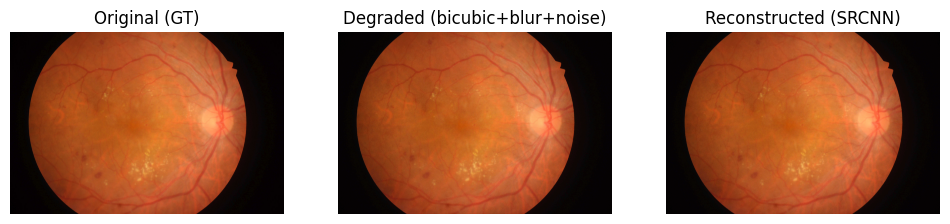

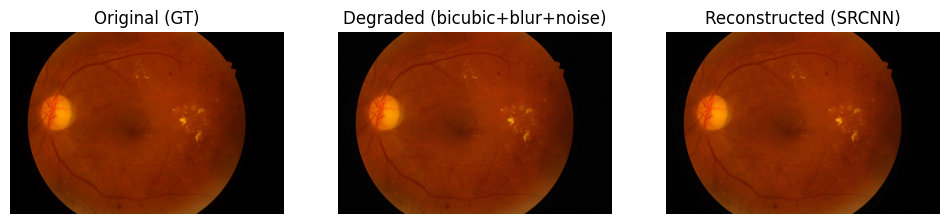

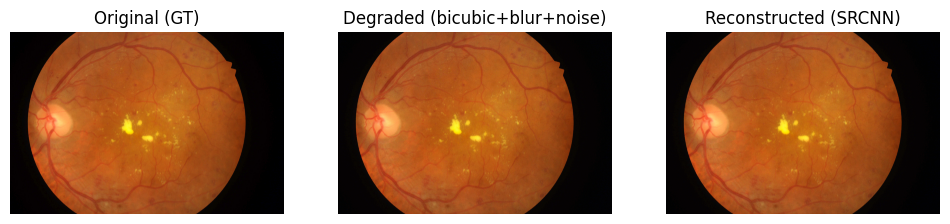

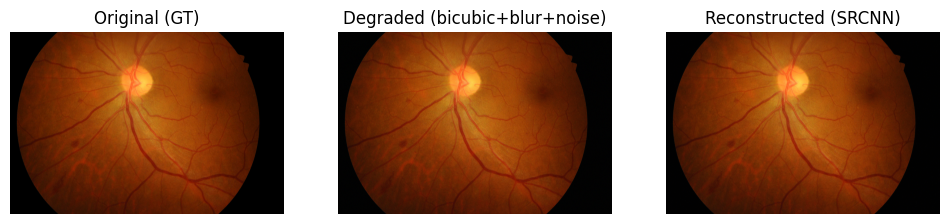

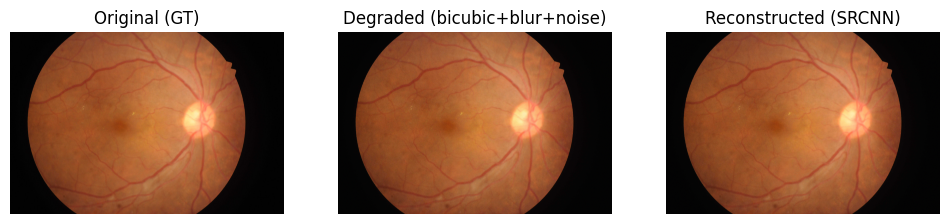

bicubic_psnr   33.793
bicubic_ssim    0.666
sr_psnr        38.539
sr_ssim         0.842
Saved metrics → /content/outputs/metrics/sr_eval_full.csv
Saved demos   → /content/outputs/demos


In [10]:
# --- Colab: Full image degradation + SR reconstruction with progress + inline plots ---
import os, torch, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm
import torch.nn.functional as F
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio as psnr_metric, structural_similarity as ssim_metric

from src.config.loader import load_cfg
from src.utils.paths import list_images, ensure_dir
from src.models.sr import build_sr

# ---------------- Utility helpers ----------------
def _core_for_load(model):
    if hasattr(model, "module"):
        m = getattr(model, "module")
        return m() if callable(m) else m
    if hasattr(model, "_m"):
        return model._m
    return model

def _load_rgb(path: str):
    return np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0

def degrade_bicubic_torch(hr_tensor, scale=4, blur=True, noise_std=0.02):
    """Downscale, then upsample with bicubic. Add blur/noise if requested."""
    B, C, H, W = hr_tensor.shape
    h2, w2 = H // scale, W // scale
    lr = F.interpolate(hr_tensor, size=(h2, w2), mode="bicubic", align_corners=False)
    lr_up = F.interpolate(lr, size=(H, W), mode="bicubic", align_corners=False)
    if blur:
        # simple 3x3 average blur
        kernel = torch.ones((C,1,3,3), device=hr_tensor.device) / 9.0
        lr_up = torch.conv2d(lr_up, kernel, padding=1, groups=C)
    if noise_std > 0:
        lr_up = (lr_up + noise_std*torch.randn_like(lr_up)).clamp(0,1)
    return lr_up

# ---------------- Main evaluation ----------------
@torch.no_grad()
def eval_full_images(
    model_name="srcnn",
    cfg_path="config.yaml",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_full.csv",
    out_dir="/content/outputs/demos",
    limit=5,
    scale=4,
    blur=True,
    noise_std=0.02,
    use_amp=True
):
    # -------- Device selection --------
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Device: {device}")
    if device == "cuda":
        print("CUDA:", torch.cuda.get_device_name(0))
        print("VRAM (GB):", round(torch.cuda.get_device_properties(0).total_memory/(1024**3), 2))
        torch.backends.cudnn.benchmark = True

    # -------- Load config + images --------
    cfg = load_cfg(cfg_path)
    seg_imgs = list_images(cfg.paths.segmentation_images)
    if not seg_imgs:
        raise FileNotFoundError(f"No images found at {cfg.paths.segmentation_images}")
    print(f"Found {len(seg_imgs)} images")

    val_paths = seg_imgs[:limit] if limit else seg_imgs

    ensure_dir(Path(out_csv).parent)
    ensure_dir(Path(out_dir))

    # -------- Model + checkpoint --------
    model = build_sr(model_name, device=device, cfg=cfg).to(device)
    if ckpt_path and Path(ckpt_path).exists():
        state = torch.load(ckpt_path, map_location=device)
        _core_for_load(model).load_state_dict(state.get("model", state), strict=False)
        print(f"Loaded checkpoint: {ckpt_path}")
    model.eval_mode()

    rows = []
    amp_ctx = (
        torch.autocast(device_type="cuda", dtype=torch.float16)
        if (use_amp and device == "cuda") else torch.cpu.amp.autocast(enabled=False)
    )

    # -------- Loop over full images --------
    pbar = tqdm(val_paths, desc=f"[Eval Full:{model_name}]")
    for i, p in enumerate(pbar, 1):
        hr_np = _load_rgb(p)
        hr = torch.from_numpy(hr_np.transpose(2,0,1)).unsqueeze(0).to(device).float()

        # Degrade
        lr_up = degrade_bicubic_torch(hr, scale=scale, blur=blur, noise_std=noise_std)

        # SR reconstruction
        with amp_ctx:
            sr = model.forward_tensor(lr_up).clamp(0,1)

        # Convert to numpy for metrics + display (always cast to float32)
        hr_np = hr[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        lr_np = lr_up[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        sr_np = sr[0].cpu().permute(1,2,0).numpy().astype(np.float32)

        bic_psnr = psnr_metric(hr_np, lr_np, data_range=1.0)
        bic_ssim = ssim_metric(hr_np, lr_np, channel_axis=2, data_range=1.0)
        sr_psnr  = psnr_metric(hr_np, sr_np, data_range=1.0)
        sr_ssim  = ssim_metric(hr_np, sr_np, channel_axis=2, data_range=1.0)

        rows.append({
            "id": Path(p).stem,
            "bicubic_psnr": bic_psnr,
            "bicubic_ssim": bic_ssim,
            "sr_psnr": sr_psnr,
            "sr_ssim": sr_ssim
        })

        # Inline + save demo
        fig, axs = plt.subplots(1,3, figsize=(12,4))
        axs[0].imshow(hr_np); axs[0].set_title("Original (GT)")
        axs[1].imshow(lr_np); axs[1].set_title("Degraded (bicubic+blur+noise)")
        axs[2].imshow(sr_np); axs[2].set_title(f"Reconstructed ({model_name.upper()})")
        for ax in axs: ax.axis("off")
        plt.show()
        fig.savefig(Path(out_dir) / f"demo_{model_name}_{Path(p).stem}.png")
        plt.close(fig)

    # -------- Save CSV --------
    df = pd.DataFrame(rows)
    df.to_csv(out_csv, index=False)
    print(df.mean(numeric_only=True).to_string(float_format=lambda x: f"{x:.3f}"))
    print(f"Saved metrics → {out_csv}")
    print(f"Saved demos   → {out_dir}")

# 🔹 Run
eval_full_images(
    model_name="srcnn",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_full.csv",
    out_dir="/content/outputs/demos",
    limit=5,   # change this to None for all images
    scale=4,
    blur=True,
    noise_std=0.02,
    use_amp=True
)


Device: cuda | Preset: medium (scale=4, σ=1.2, noise=0.02)
Found 81 images
Loaded checkpoint: outputs/sr_models/srcnn_best.pt


[Eval medium:srcnn]:   0%|          | 0/10 [00:00<?, ?it/s]

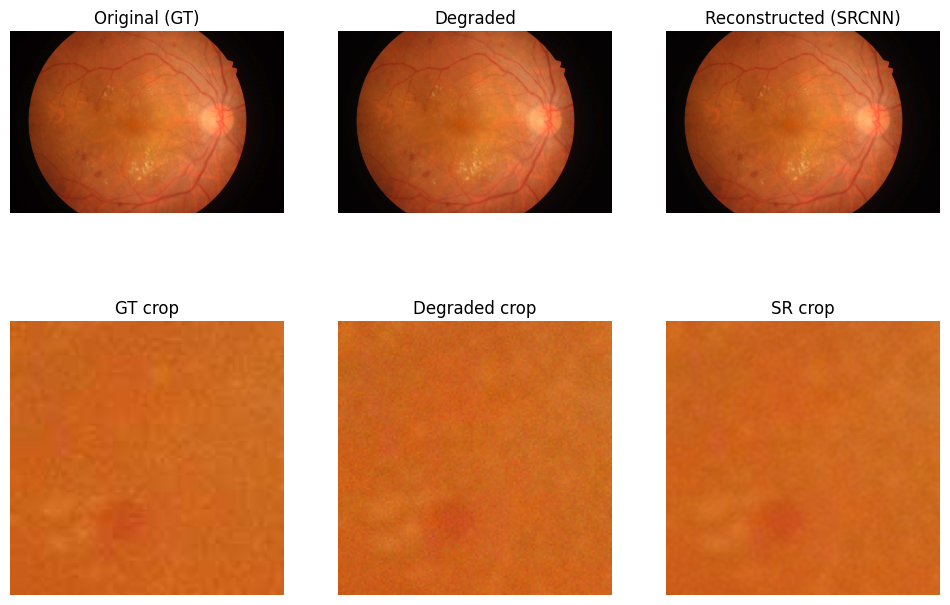

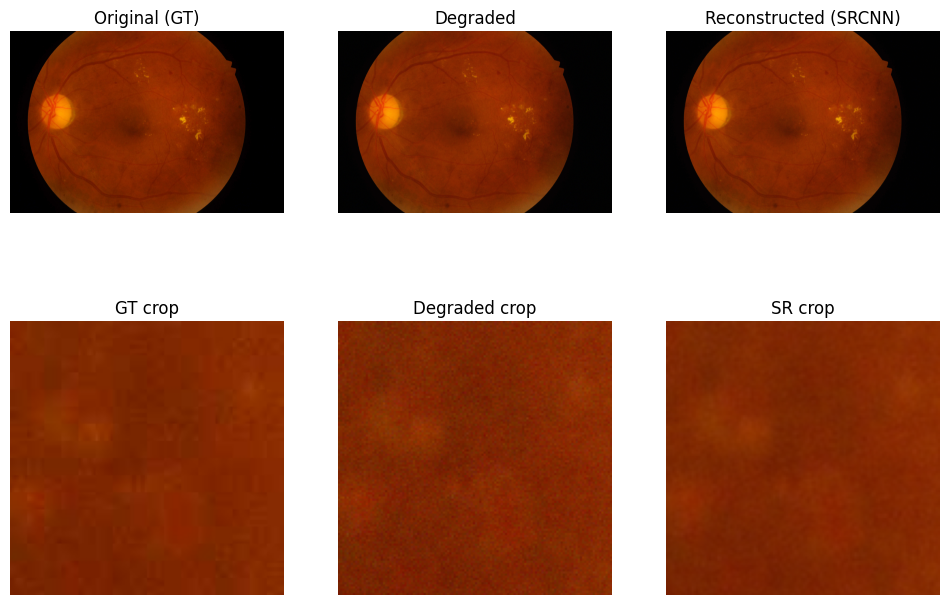

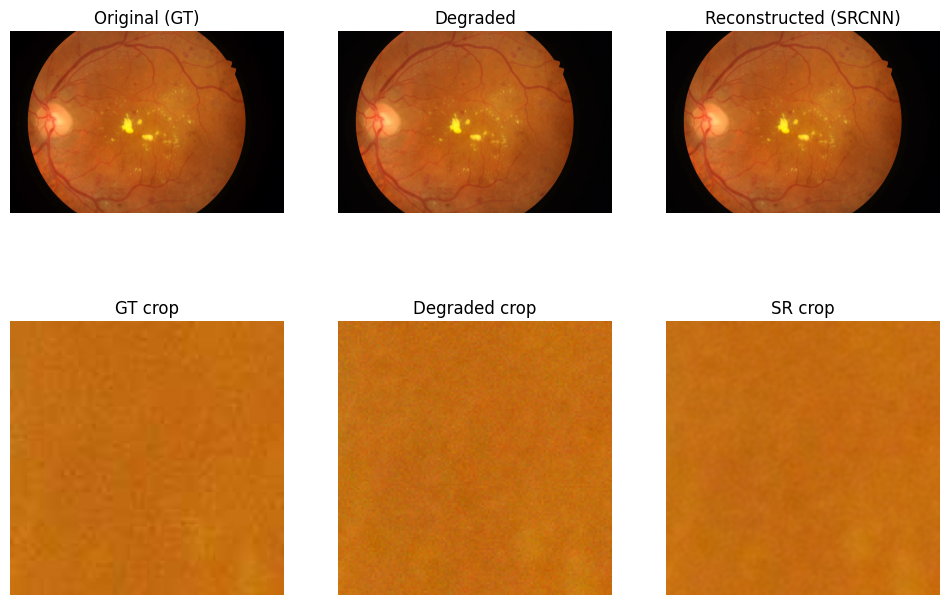

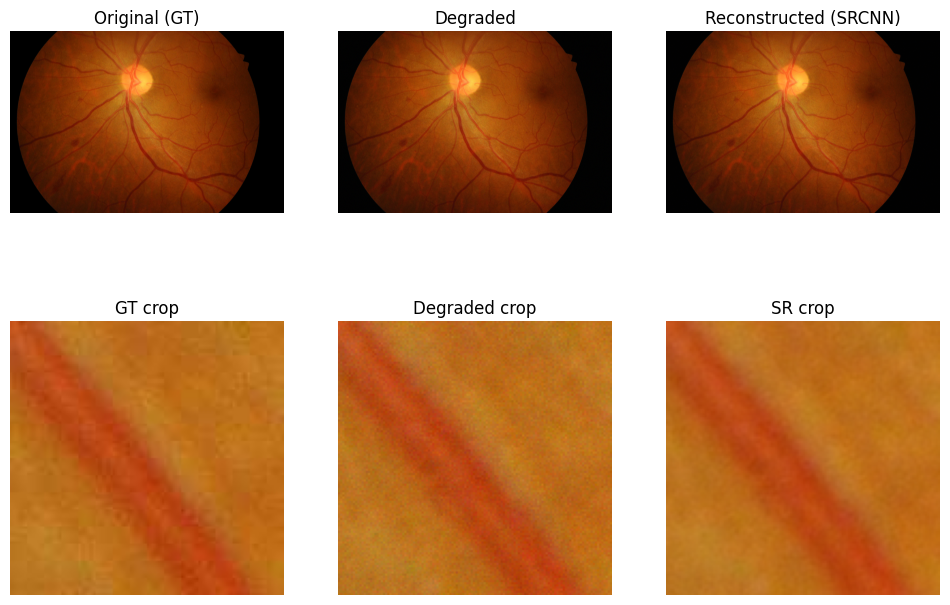

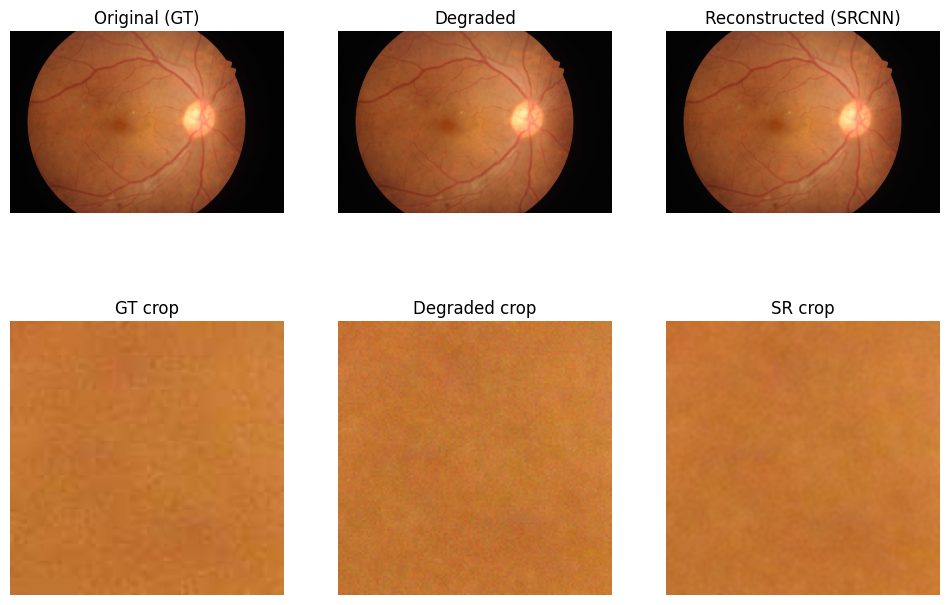

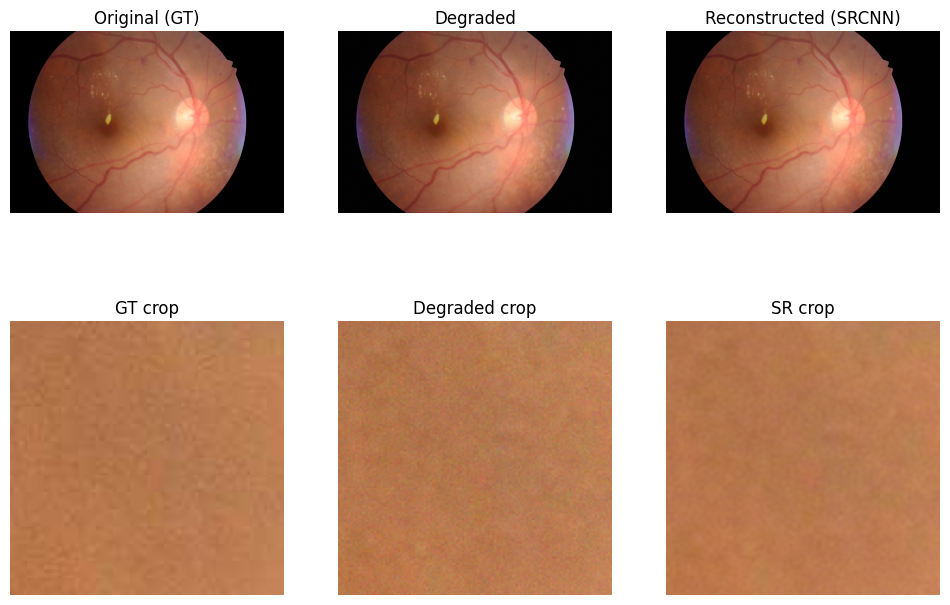

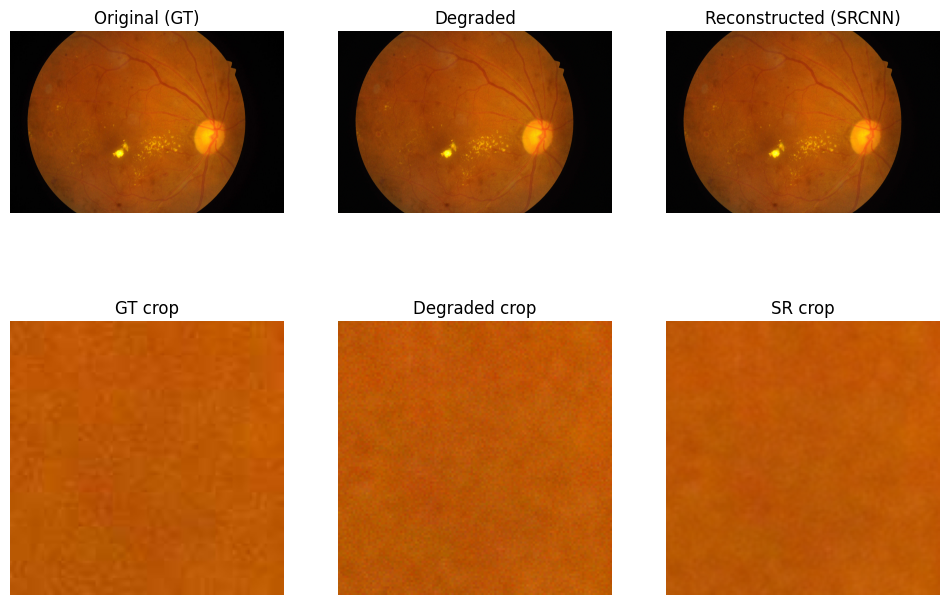

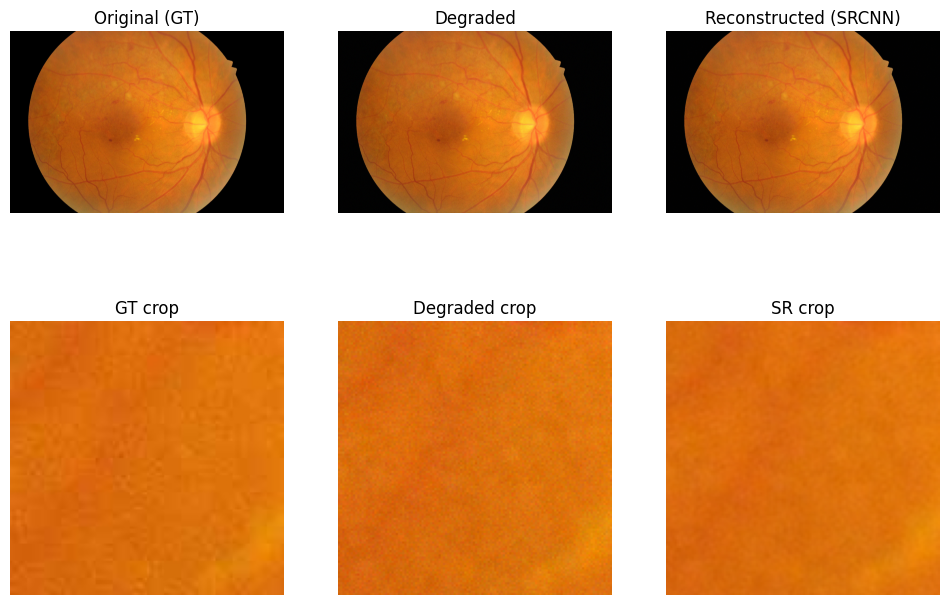

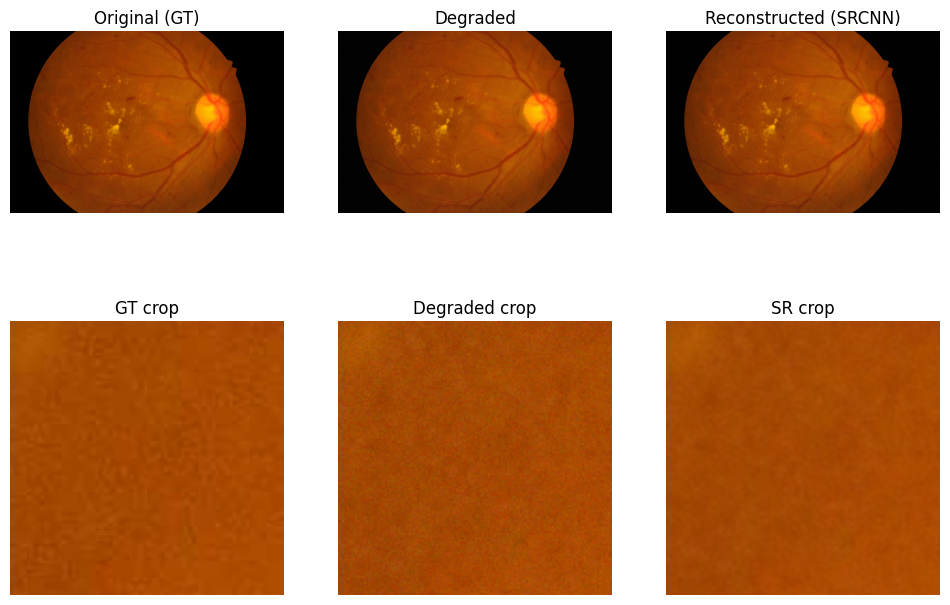

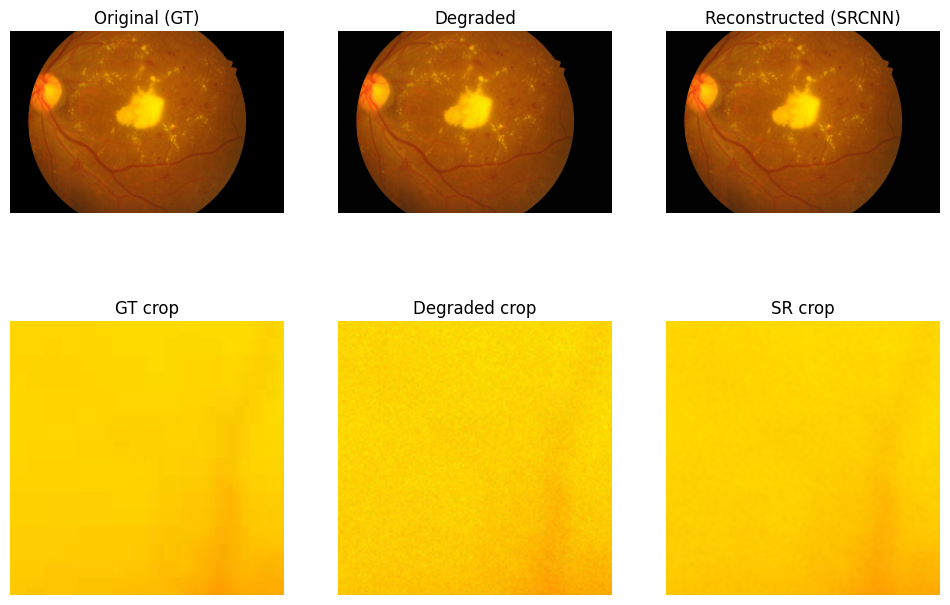

bicubic_psnr   33.773
bicubic_ssim    0.653
sr_psnr        38.234
sr_ssim         0.824
Saved metrics → /content/outputs/metrics/sr_eval_multi.csv
Saved demos   → /content/outputs/demos_multi


In [12]:
# --- Colab: Full image degradation + SR reconstruction (multi-level) ---
import os, torch, numpy as np, pandas as pd, matplotlib.pyplot as plt, math
from pathlib import Path
from tqdm.auto import tqdm
import torch.nn.functional as F
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio as psnr_metric, structural_similarity as ssim_metric

from src.config.loader import load_cfg
from src.utils.paths import list_images, ensure_dir
from src.models.sr import build_sr

# ---------------- Utility helpers ----------------
def _core_for_load(model):
    if hasattr(model, "module"):
        m = getattr(model, "module")
        return m() if callable(m) else m
    if hasattr(model, "_m"):
        return model._m
    return model

def _load_rgb(path: str):
    return np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0

def gaussian_blur(img, sigma=1.2):
    """Gaussian blur using conv2d."""
    size = int(2*math.ceil(2*sigma)+1)
    x = torch.arange(-size//2+1., size//2+1., device=img.device)
    g = torch.exp(-(x**2)/(2*sigma**2))
    g = (g/g.sum())
    kernel = (g[:,None] @ g[None,:]).unsqueeze(0).unsqueeze(0)
    kernel = kernel / kernel.sum()
    C = img.shape[1]
    return F.conv2d(img, kernel.expand(C,1,*kernel.shape[2:]), padding=size//2, groups=C)

def degrade_custom(hr_tensor, scale=4, sigma=1.2, noise_std=0.02):
    """Downscale, upsample, blur, add noise."""
    B, C, H, W = hr_tensor.shape
    h2, w2 = H // scale, W // scale
    lr = F.interpolate(hr_tensor, size=(h2, w2), mode="bicubic", align_corners=False)
    lr_up = F.interpolate(lr, size=(H, W), mode="bicubic", align_corners=False)
    lr_up = gaussian_blur(lr_up, sigma=sigma)
    if noise_std > 0:
        lr_up = (lr_up + noise_std*torch.randn_like(lr_up)).clamp(0,1)
    return lr_up

# ---------------- Main evaluation ----------------
@torch.no_grad()
def eval_full_images(
    model_name="srcnn",
    cfg_path="config.yaml",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_multi.csv",
    out_dir="/content/outputs/demos_multi",
    limit=10,
    preset="medium",   # easy | medium | harsh
    use_amp=True
):
    presets = {
        "easy":   {"scale":2, "sigma":0.8, "noise":0.01},
        "medium": {"scale":4, "sigma":1.2, "noise":0.02},
        "harsh":  {"scale":6, "sigma":1.8, "noise":0.03},
    }
    if preset not in presets:
        raise ValueError(f"Unknown preset {preset}, choose from {list(presets.keys())}")
    scale, sigma, noise_std = presets[preset].values()

    # -------- Device selection --------
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Device: {device} | Preset: {preset} (scale={scale}, σ={sigma}, noise={noise_std})")

    # -------- Load config + images --------
    cfg = load_cfg(cfg_path)
    seg_imgs = list_images(cfg.paths.segmentation_images)
    if not seg_imgs:
        raise FileNotFoundError(f"No images found at {cfg.paths.segmentation_images}")
    print(f"Found {len(seg_imgs)} images")

    val_paths = seg_imgs[:limit] if limit else seg_imgs

    ensure_dir(Path(out_csv).parent)
    ensure_dir(Path(out_dir))

    # -------- Model + checkpoint --------
    model = build_sr(model_name, device=device, cfg=cfg).to(device)
    if ckpt_path and Path(ckpt_path).exists():
        state = torch.load(ckpt_path, map_location=device)
        _core_for_load(model).load_state_dict(state.get("model", state), strict=False)
        print(f"Loaded checkpoint: {ckpt_path}")
    model.eval_mode()

    rows = []
    amp_ctx = (
        torch.autocast(device_type="cuda", dtype=torch.float16)
        if (use_amp and device == "cuda") else torch.cpu.amp.autocast(enabled=False)
    )

    # -------- Loop over full images --------
    pbar = tqdm(val_paths, desc=f"[Eval {preset}:{model_name}]")
    for i, p in enumerate(pbar, 1):
        hr_np = _load_rgb(p)
        hr = torch.from_numpy(hr_np.transpose(2,0,1)).unsqueeze(0).to(device).float()

        # Degrade
        lr_up = degrade_custom(hr, scale=scale, sigma=sigma, noise_std=noise_std)

        # SR reconstruction
        with amp_ctx:
            sr = model.forward_tensor(lr_up).clamp(0,1)

        # Convert to numpy for metrics + display
        hr_np = hr[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        lr_np = lr_up[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        sr_np = sr[0].cpu().permute(1,2,0).numpy().astype(np.float32)

        bic_psnr = psnr_metric(hr_np, lr_np, data_range=1.0)
        bic_ssim = ssim_metric(hr_np, lr_np, channel_axis=2, data_range=1.0)
        sr_psnr  = psnr_metric(hr_np, sr_np, data_range=1.0)
        sr_ssim  = ssim_metric(hr_np, sr_np, channel_axis=2, data_range=1.0)

        rows.append({
            "id": Path(p).stem,
            "bicubic_psnr": bic_psnr,
            "bicubic_ssim": bic_ssim,
            "sr_psnr": sr_psnr,
            "sr_ssim": sr_ssim
        })

        # Inline + save demo with zoom crop
        fig, axs = plt.subplots(2,3, figsize=(12,8))
        axs[0,0].imshow(hr_np); axs[0,0].set_title("Original (GT)")
        axs[0,1].imshow(lr_np); axs[0,1].set_title("Degraded")
        axs[0,2].imshow(sr_np); axs[0,2].set_title(f"Reconstructed ({model_name.upper()})")

        # Zoomed crop (center 128x128)
        H, W, _ = hr_np.shape
        ch, cw = H//2, W//2
        crop = 128
        def crop_center(img): return img[ch-crop//2:ch+crop//2, cw-crop//2:cw+crop//2]

        axs[1,0].imshow(crop_center(hr_np)); axs[1,0].set_title("GT crop")
        axs[1,1].imshow(crop_center(lr_np)); axs[1,1].set_title("Degraded crop")
        axs[1,2].imshow(crop_center(sr_np)); axs[1,2].set_title("SR crop")

        for ax in axs.ravel(): ax.axis("off")
        plt.show()
        fig.savefig(Path(out_dir) / f"{preset}_{model_name}_{Path(p).stem}.png")
        plt.close(fig)

    # -------- Save CSV --------
    df = pd.DataFrame(rows)
    df.to_csv(out_csv, index=False)
    print(df.mean(numeric_only=True).to_string(float_format=lambda x: f"{x:.3f}"))
    print(f"Saved metrics → {out_csv}")
    print(f"Saved demos   → {out_dir}")

# 🔹 Run (change preset: "easy", "medium", "harsh")
eval_full_images(
    model_name="srcnn",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_multi.csv",
    out_dir="/content/outputs/demos_multi",
    limit=10,    # show 10 images inline
    preset="medium",
    use_amp=True
)


Device: cuda | Preset: harsh (scale=6, σ=1.8, noise=0.03)
Found 81 images
Loaded checkpoint: outputs/sr_models/srcnn_best.pt


[Eval harsh:srcnn]:   0%|          | 0/5 [00:00<?, ?it/s]

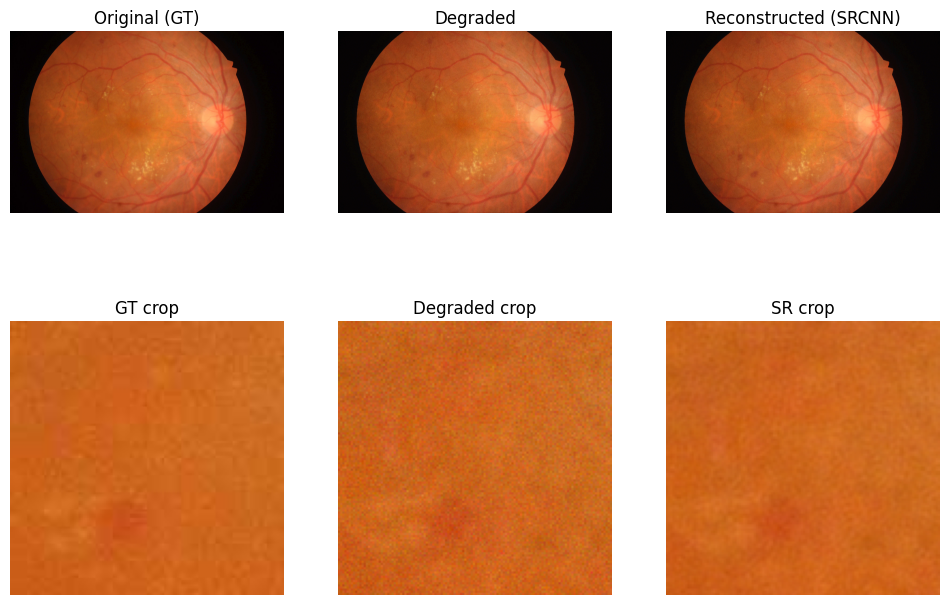

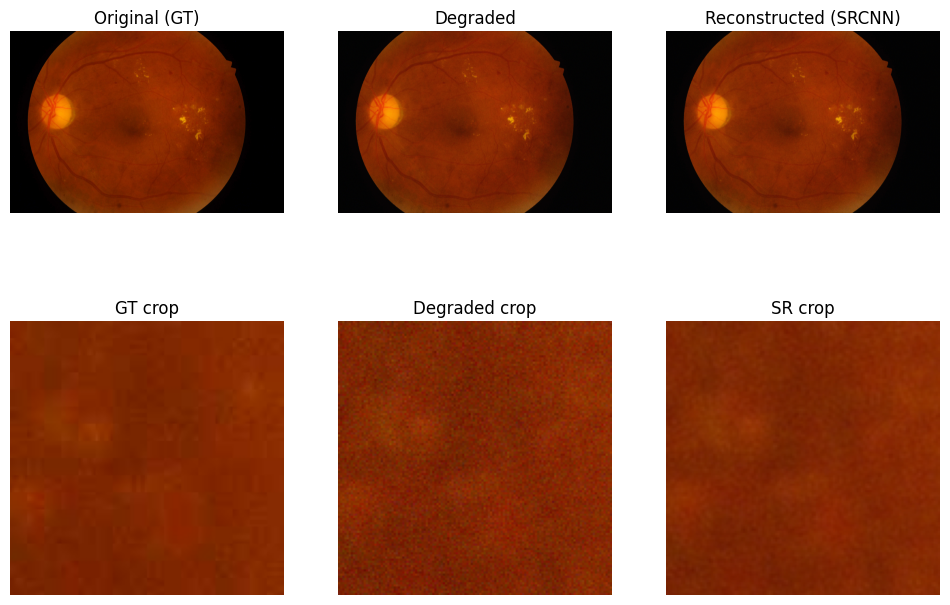

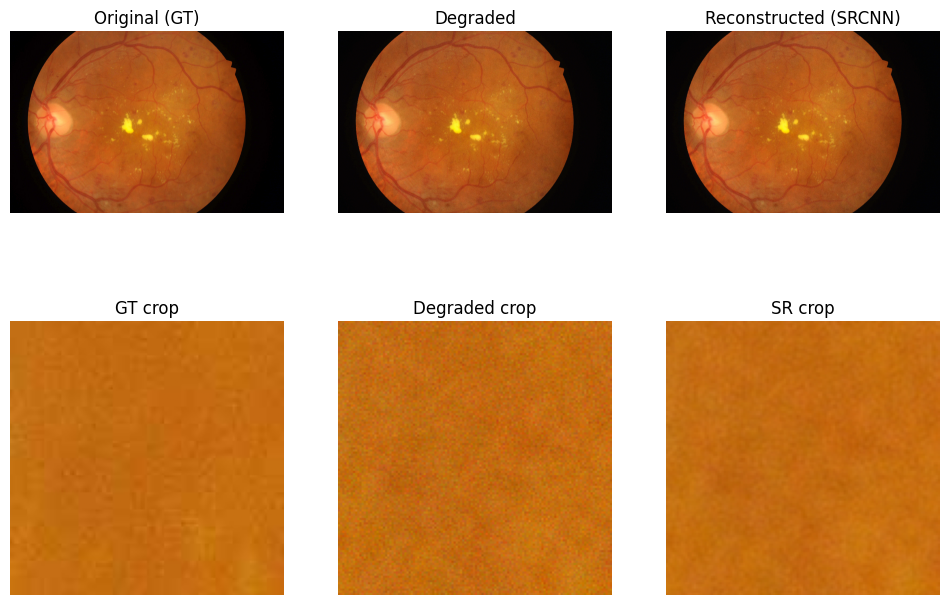

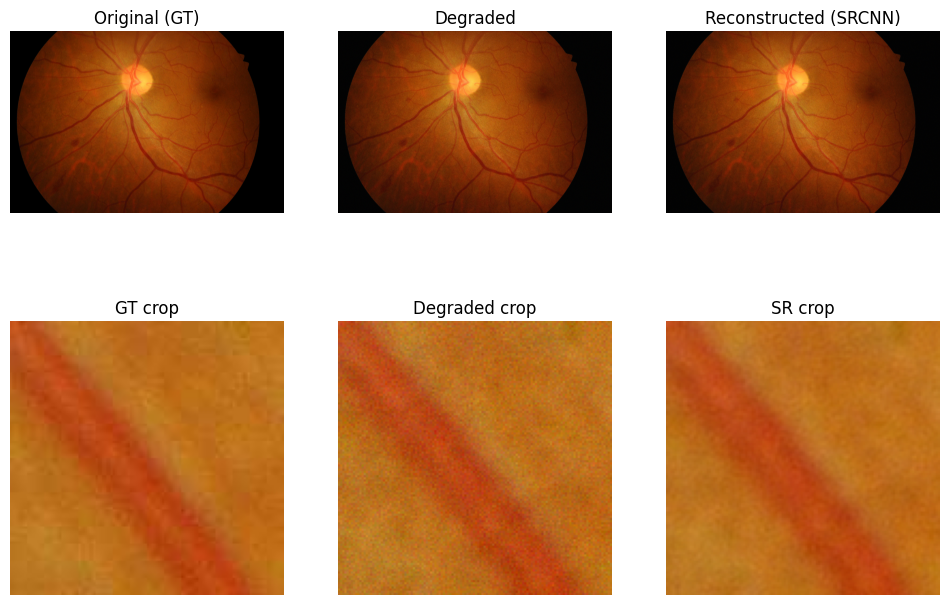

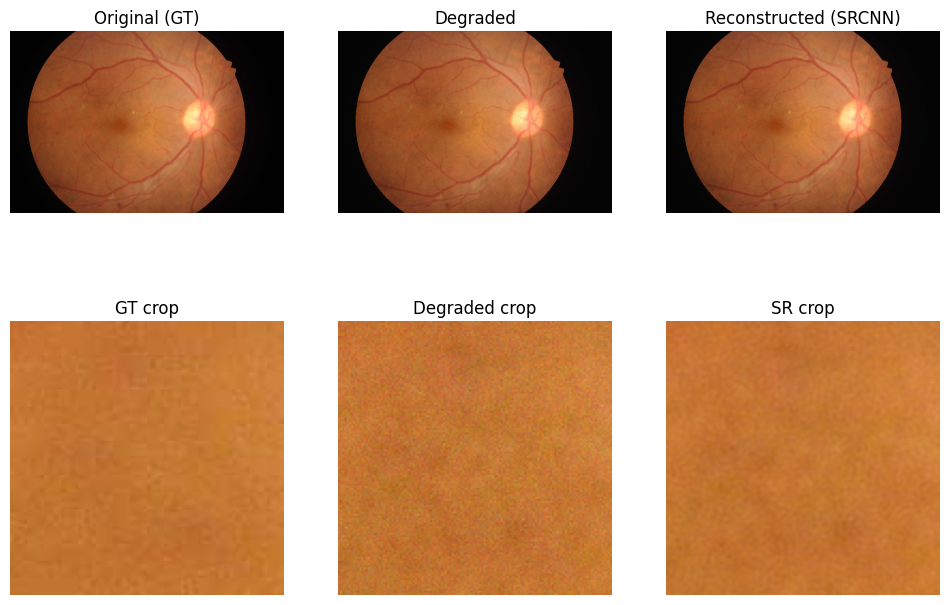

bicubic_psnr   30.626
bicubic_ssim    0.484
sr_psnr        35.934
sr_ssim         0.748
Saved metrics → /content/outputs/metrics/sr_eval_full_extreme.csv
Saved demos   → /content/outputs/demos_extreme


In [14]:
# --- Colab: Full image degradation + SR reconstruction (multi-level) ---
import os, torch, numpy as np, pandas as pd, matplotlib.pyplot as plt, math
from pathlib import Path
from tqdm.auto import tqdm
import torch.nn.functional as F
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio as psnr_metric, structural_similarity as ssim_metric

from src.config.loader import load_cfg
from src.utils.paths import list_images, ensure_dir
from src.models.sr import build_sr

# ---------------- Utility helpers ----------------
def _core_for_load(model):
    if hasattr(model, "module"):
        m = getattr(model, "module")
        return m() if callable(m) else m
    if hasattr(model, "_m"):
        return model._m
    return model

def _load_rgb(path: str):
    return np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0

def gaussian_blur(img, sigma=1.2):
    """Gaussian blur using conv2d."""
    size = int(2*math.ceil(2*sigma)+1)
    x = torch.arange(-size//2+1., size//2+1., device=img.device)
    g = torch.exp(-(x**2)/(2*sigma**2))
    g = (g/g.sum())
    kernel = (g[:,None] @ g[None,:]).unsqueeze(0).unsqueeze(0)
    kernel = kernel / kernel.sum()
    C = img.shape[1]
    return F.conv2d(img, kernel.expand(C,1,*kernel.shape[2:]), padding=size//2, groups=C)

def degrade_custom(hr_tensor, scale=4, sigma=1.2, noise_std=0.02):
    """Downscale, upsample, blur, add noise."""
    B, C, H, W = hr_tensor.shape
    h2, w2 = H // scale, W // scale
    lr = F.interpolate(hr_tensor, size=(h2, w2), mode="bicubic", align_corners=False)
    lr_up = F.interpolate(lr, size=(H, W), mode="bicubic", align_corners=False)
    lr_up = gaussian_blur(lr_up, sigma=sigma)
    if noise_std > 0:
        lr_up = (lr_up + noise_std*torch.randn_like(lr_up)).clamp(0,1)
    return lr_up

# ---------------- Main evaluation ----------------
@torch.no_grad()
def eval_full_images(
    model_name="srcnn",
    cfg_path="config.yaml",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_multi.csv",
    out_dir="/content/outputs/demos_multi",
    limit=10,
    preset="medium",   # easy | medium | harsh
    use_amp=True
):
    presets = {
        "easy":   {"scale":2, "sigma":0.8, "noise":0.01},
        "medium": {"scale":4, "sigma":1.2, "noise":0.02},
        "harsh":  {"scale":6, "sigma":1.8, "noise":0.03},
    }
    if preset not in presets:
        raise ValueError(f"Unknown preset {preset}, choose from {list(presets.keys())}")
    scale, sigma, noise_std = presets[preset].values()

    # -------- Device selection --------
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Device: {device} | Preset: {preset} (scale={scale}, σ={sigma}, noise={noise_std})")

    # -------- Load config + images --------
    cfg = load_cfg(cfg_path)
    seg_imgs = list_images(cfg.paths.segmentation_images)
    if not seg_imgs:
        raise FileNotFoundError(f"No images found at {cfg.paths.segmentation_images}")
    print(f"Found {len(seg_imgs)} images")

    val_paths = seg_imgs[:limit] if limit else seg_imgs

    ensure_dir(Path(out_csv).parent)
    ensure_dir(Path(out_dir))

    # -------- Model + checkpoint --------
    model = build_sr(model_name, device=device, cfg=cfg).to(device)
    if ckpt_path and Path(ckpt_path).exists():
        state = torch.load(ckpt_path, map_location=device)
        _core_for_load(model).load_state_dict(state.get("model", state), strict=False)
        print(f"Loaded checkpoint: {ckpt_path}")
    model.eval_mode()

    rows = []
    amp_ctx = (
        torch.autocast(device_type="cuda", dtype=torch.float16)
        if (use_amp and device == "cuda") else torch.cpu.amp.autocast(enabled=False)
    )

    # -------- Loop over full images --------
    pbar = tqdm(val_paths, desc=f"[Eval {preset}:{model_name}]")
    for i, p in enumerate(pbar, 1):
        hr_np = _load_rgb(p)
        hr = torch.from_numpy(hr_np.transpose(2,0,1)).unsqueeze(0).to(device).float()

        # Degrade
        lr_up = degrade_custom(hr, scale=scale, sigma=sigma, noise_std=noise_std)

        # SR reconstruction
        with amp_ctx:
            sr = model.forward_tensor(lr_up).clamp(0,1)

        # Convert to numpy for metrics + display
        hr_np = hr[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        lr_np = lr_up[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        sr_np = sr[0].cpu().permute(1,2,0).numpy().astype(np.float32)

        bic_psnr = psnr_metric(hr_np, lr_np, data_range=1.0)
        bic_ssim = ssim_metric(hr_np, lr_np, channel_axis=2, data_range=1.0)
        sr_psnr  = psnr_metric(hr_np, sr_np, data_range=1.0)
        sr_ssim  = ssim_metric(hr_np, sr_np, channel_axis=2, data_range=1.0)

        rows.append({
            "id": Path(p).stem,
            "bicubic_psnr": bic_psnr,
            "bicubic_ssim": bic_ssim,
            "sr_psnr": sr_psnr,
            "sr_ssim": sr_ssim
        })

        # Inline + save demo with zoom crop
        fig, axs = plt.subplots(2,3, figsize=(12,8))
        axs[0,0].imshow(hr_np); axs[0,0].set_title("Original (GT)")
        axs[0,1].imshow(lr_np); axs[0,1].set_title("Degraded")
        axs[0,2].imshow(sr_np); axs[0,2].set_title(f"Reconstructed ({model_name.upper()})")

        # Zoomed crop (center 128x128)
        H, W, _ = hr_np.shape
        ch, cw = H//2, W//2
        crop = 128
        def crop_center(img): return img[ch-crop//2:ch+crop//2, cw-crop//2:cw+crop//2]

        axs[1,0].imshow(crop_center(hr_np)); axs[1,0].set_title("GT crop")
        axs[1,1].imshow(crop_center(lr_np)); axs[1,1].set_title("Degraded crop")
        axs[1,2].imshow(crop_center(sr_np)); axs[1,2].set_title("SR crop")

        for ax in axs.ravel(): ax.axis("off")
        plt.show()
        fig.savefig(Path(out_dir) / f"{preset}_{model_name}_{Path(p).stem}.png")
        plt.close(fig)

    # -------- Save CSV --------
    df = pd.DataFrame(rows)
    df.to_csv(out_csv, index=False)
    print(df.mean(numeric_only=True).to_string(float_format=lambda x: f"{x:.3f}"))
    print(f"Saved metrics → {out_csv}")
    print(f"Saved demos   → {out_dir}")

# --- Run with chosen preset ---
eval_full_images(
    model_name="srcnn",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_full_extreme.csv",
    out_dir="/content/outputs/demos_extreme",
    limit=5,
    preset="harsh",   # choose: "easy" | "medium" | "harsh"
    use_amp=True
)




Device: cuda | scale=8, σ=1.8, noise=0.06
Found 81 images


[Eval srcnn]:   0%|          | 0/5 [00:00<?, ?it/s]

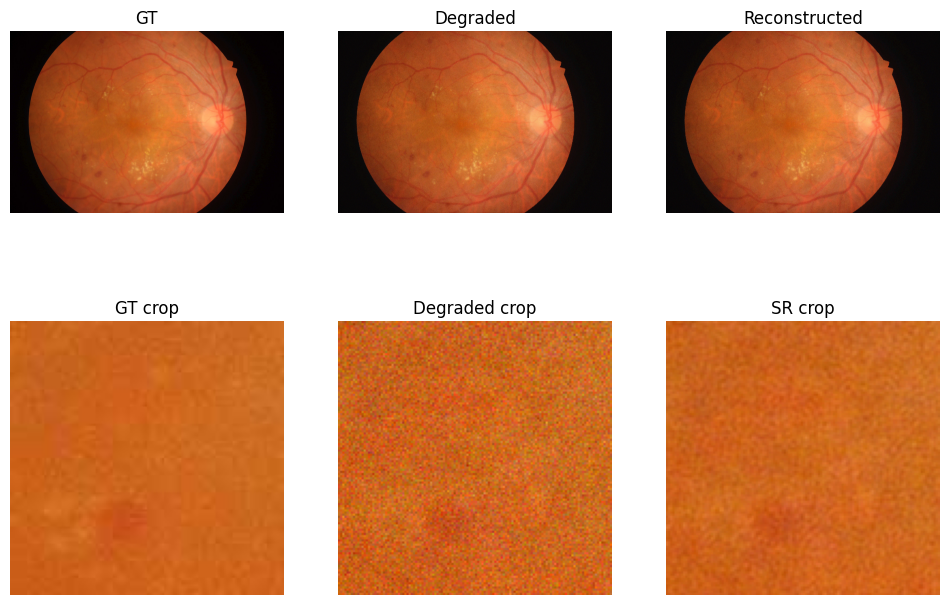

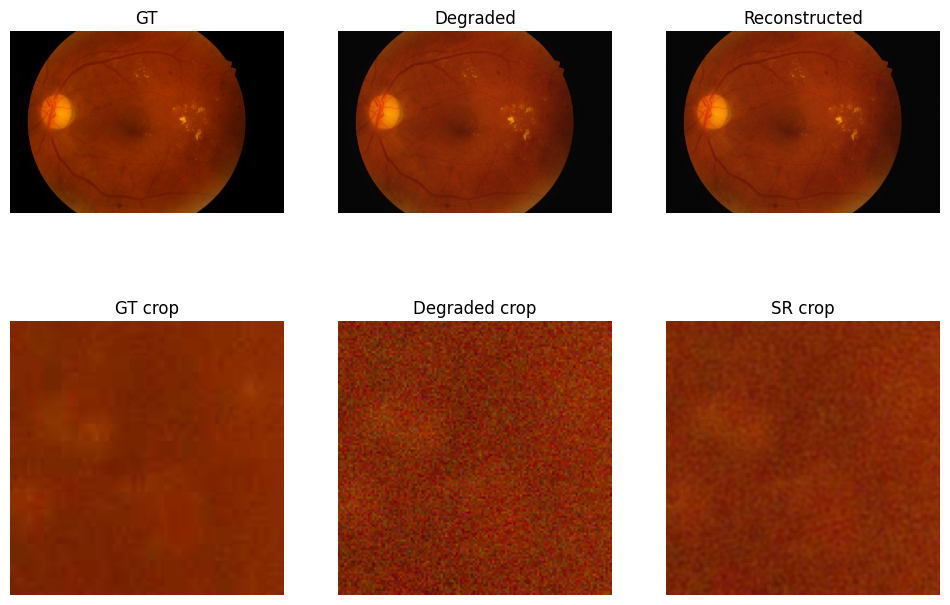

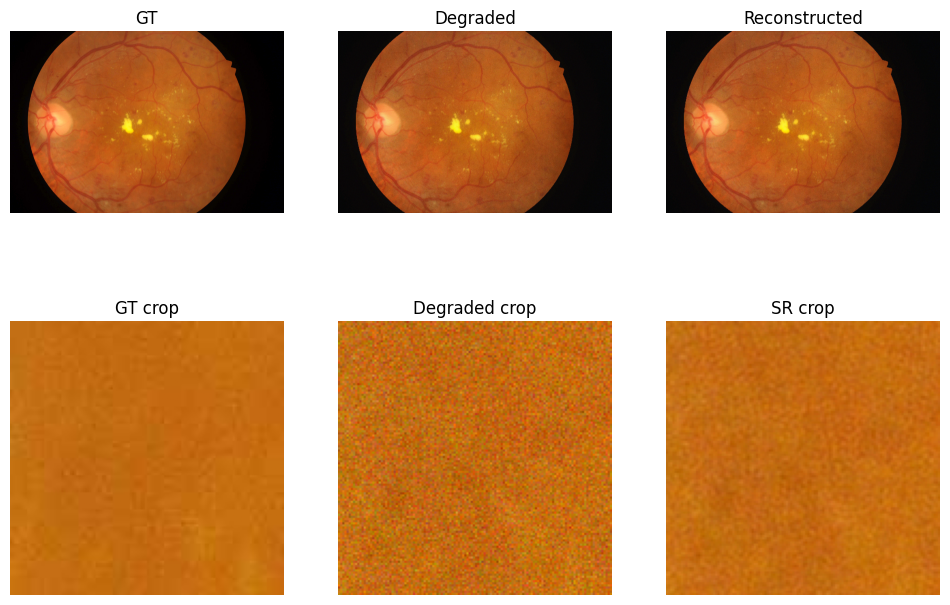

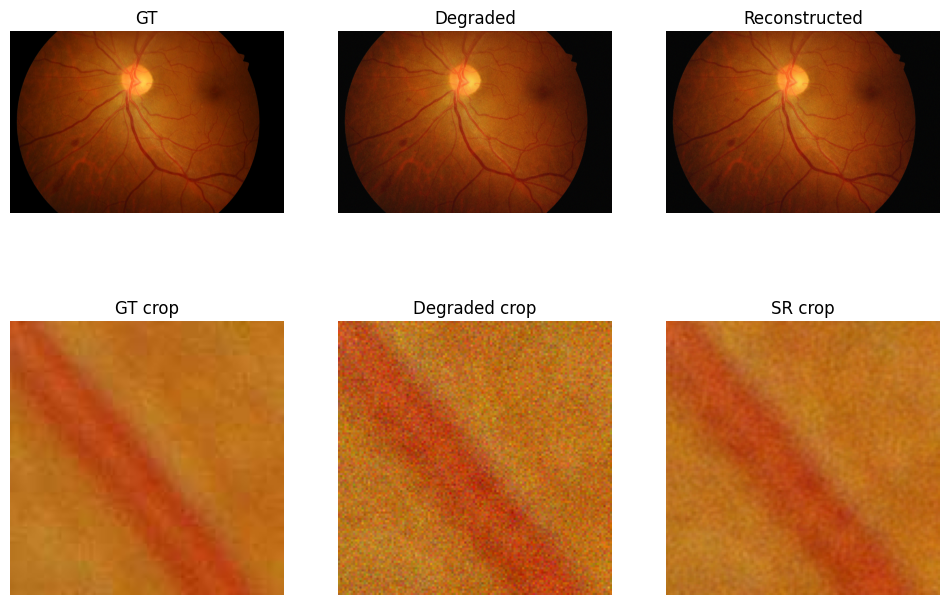

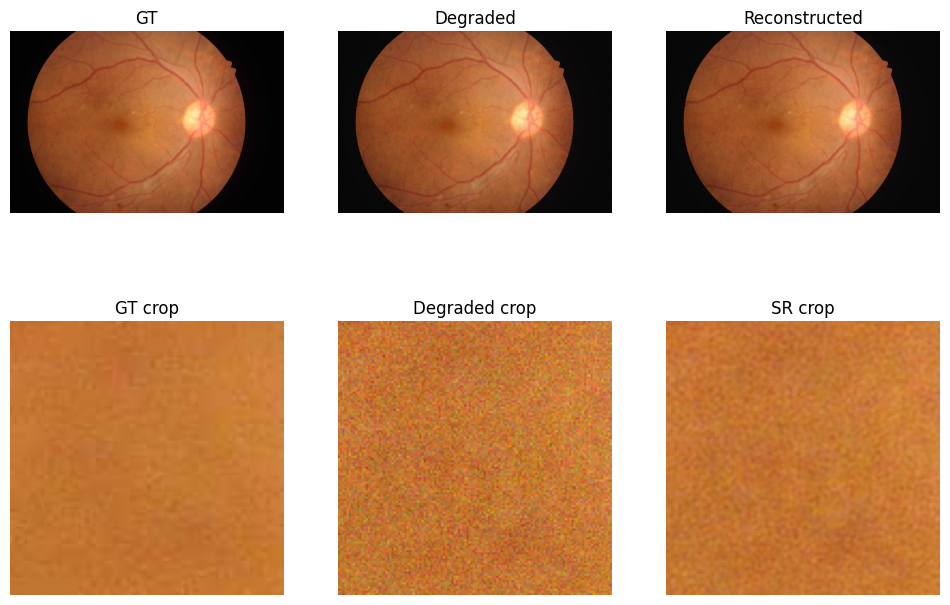


=== AVERAGE METRICS ===
bicubic_psnr        25.194
bicubic_ssim         0.205
sr_psnr             31.981
sr_ssim              0.559
bicubic_psnr_mask   25.194
bicubic_ssim_mask    0.205
sr_psnr_mask        31.980
sr_ssim_mask         0.559
Saved metrics → /content/outputs/metrics/sr_eval_masked.csv
Saved demos   → /content/outputs/demos_masked


In [16]:
# --- Colab: Full image degradation + SR reconstruction + lesion-masked metrics + crops ---
import os, torch, numpy as np, pandas as pd, matplotlib.pyplot as plt, math
from pathlib import Path
from tqdm.auto import tqdm
import torch.nn.functional as F
from PIL import Image
from skimage.metrics import peak_signal_noise_ratio as psnr_metric, structural_similarity as ssim_metric

from src.config.loader import load_cfg
from src.utils.paths import list_images, ensure_dir
from src.datasets.segmentation import list_mask_image_ids
from src.models.sr import build_sr

# ---------------- Utility helpers ----------------
def _core_for_load(model):
    if hasattr(model, "module"):
        m = getattr(model, "module")
        return m() if callable(m) else m
    if hasattr(model, "_m"):
        return model._m
    return model

def _load_rgb(path: str):
    return np.asarray(Image.open(path).convert("RGB"), dtype=np.float32) / 255.0

def _load_mask(mask_root: str, stem: str, target_size):
    mask_path = Path(mask_root) / f"{stem}.png"
    if not mask_path.exists():
        return np.ones(target_size, dtype=np.float32)
    mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32) / 255.0
    mask = np.where(mask > 0.5, 1.0, 0.0).astype(np.float32)
    mask = np.array(Image.fromarray(mask).resize((target_size[1], target_size[0]), Image.NEAREST))
    return mask

def gaussian_blur(img, sigma=1.2):
    size = int(2*math.ceil(2*sigma)+1)
    x = torch.arange(-size//2+1., size//2+1., device=img.device)
    g = torch.exp(-(x**2)/(2*sigma**2))
    g = (g/g.sum())
    kernel = (g[:,None] @ g[None,:]).unsqueeze(0).unsqueeze(0)
    kernel = kernel / kernel.sum()
    C = img.shape[1]
    return F.conv2d(img, kernel.expand(C,1,*kernel.shape[2:]), padding=size//2, groups=C)

def degrade_custom(hr_tensor, scale=4, sigma=1.2, noise_std=0.02):
    B, C, H, W = hr_tensor.shape
    h2, w2 = H // scale, W // scale
    lr = F.interpolate(hr_tensor, size=(h2, w2), mode="bicubic", align_corners=False)
    lr_up = F.interpolate(lr, size=(H, W), mode="bicubic", align_corners=False)
    lr_up = gaussian_blur(lr_up, sigma=sigma)
    if noise_std > 0:
        lr_up = (lr_up + noise_std*torch.randn_like(lr_up)).clamp(0,1)
    return lr_up

def masked_psnr(img1, img2, mask):
    diff = (img1 - img2) * mask[..., None]
    mse = np.sum(diff**2) / (np.sum(mask) * img1.shape[2] + 1e-8)
    return 10 * np.log10(1.0**2 / (mse + 1e-8))

def masked_ssim(img1, img2, mask):
    img1_masked = img1 * mask[..., None]
    img2_masked = img2 * mask[..., None]
    return ssim_metric(img1_masked, img2_masked, channel_axis=2, data_range=1.0)

# ---------------- Main evaluation ----------------
@torch.no_grad()
def eval_full_images(
    model_name="srcnn",
    cfg_path="config.yaml",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_masked.csv",
    out_dir="/content/outputs/demos_masked",
    limit=5,
    scale=8,
    sigma=1.8,
    noise_std=0.06,
    use_amp=True
):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Device: {device} | scale={scale}, σ={sigma}, noise={noise_std}")

    cfg = load_cfg(cfg_path)
    seg_imgs = list_images(cfg.paths.segmentation_images)
    mask_ids = set(list_mask_image_ids(cfg.paths.masks_root))

    if not seg_imgs:
        raise FileNotFoundError(f"No images found at {cfg.paths.segmentation_images}")
    print(f"Found {len(seg_imgs)} images")

    val_paths = seg_imgs[:limit] if limit else seg_imgs
    ensure_dir(Path(out_csv).parent); ensure_dir(Path(out_dir))

    model = build_sr(model_name, device=device, cfg=cfg).to(device)
    if ckpt_path and Path(ckpt_path).exists():
        state = torch.load(ckpt_path, map_location=device)
        _core_for_load(model).load_state_dict(state.get("model", state), strict=False)
    model.eval_mode()

    rows = []
    amp_ctx = torch.autocast(device_type="cuda", dtype=torch.float16) if (use_amp and device=="cuda") else torch.cpu.amp.autocast(enabled=False)

    pbar = tqdm(val_paths, desc=f"[Eval {model_name}]")
    for i, p in enumerate(pbar, 1):
        hr_np = _load_rgb(p)
        hr = torch.from_numpy(hr_np.transpose(2,0,1)).unsqueeze(0).to(device).float()

        lr_up = degrade_custom(hr, scale=scale, sigma=sigma, noise_std=noise_std)
        with amp_ctx: sr = model.forward_tensor(lr_up).clamp(0,1)

        hr_np = hr[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        lr_np = lr_up[0].cpu().permute(1,2,0).numpy().astype(np.float32)
        sr_np = sr[0].cpu().permute(1,2,0).numpy().astype(np.float32)

        mask = _load_mask(cfg.paths.masks_root, Path(p).stem, target_size=hr_np.shape[:2])

        # Global metrics
        bic_psnr = psnr_metric(hr_np, lr_np, data_range=1.0)
        bic_ssim = ssim_metric(hr_np, lr_np, channel_axis=2, data_range=1.0)
        sr_psnr  = psnr_metric(hr_np, sr_np, data_range=1.0)
        sr_ssim  = ssim_metric(hr_np, sr_np, channel_axis=2, data_range=1.0)

        # Lesion-masked metrics
        bic_psnr_mask = masked_psnr(hr_np, lr_np, mask)
        sr_psnr_mask  = masked_psnr(hr_np, sr_np, mask)
        bic_ssim_mask = masked_ssim(hr_np, lr_np, mask)
        sr_ssim_mask  = masked_ssim(hr_np, sr_np, mask)

        rows.append({
            "id": Path(p).stem,
            "bicubic_psnr": bic_psnr, "bicubic_ssim": bic_ssim,
            "sr_psnr": sr_psnr, "sr_ssim": sr_ssim,
            "bicubic_psnr_mask": bic_psnr_mask, "bicubic_ssim_mask": bic_ssim_mask,
            "sr_psnr_mask": sr_psnr_mask, "sr_ssim_mask": sr_ssim_mask
        })

        # Save demo figs with zoom crop
        H, W, _ = hr_np.shape
        ch, cw = H//2, W//2
        crop = 128
        def crop_center(img): return img[ch-crop//2:ch+crop//2, cw-crop//2:cw+crop//2]

        fig, axs = plt.subplots(2,3, figsize=(12,8))
        axs[0,0].imshow(hr_np); axs[0,0].set_title("GT")
        axs[0,1].imshow(lr_np); axs[0,1].set_title("Degraded")
        axs[0,2].imshow(sr_np); axs[0,2].set_title("Reconstructed")
        axs[1,0].imshow(crop_center(hr_np)); axs[1,0].set_title("GT crop")
        axs[1,1].imshow(crop_center(lr_np)); axs[1,1].set_title("Degraded crop")
        axs[1,2].imshow(crop_center(sr_np)); axs[1,2].set_title("SR crop")
        for ax in axs.ravel(): ax.axis("off")
        plt.show()
        fig.savefig(Path(out_dir) / f"{Path(p).stem}.png")
        plt.close(fig)

    df = pd.DataFrame(rows)
    df.to_csv(out_csv, index=False)

    # Summary: show global vs lesion-masked
    summary = df.mean(numeric_only=True)
    print("\n=== AVERAGE METRICS ===")
    print(summary.to_string(float_format=lambda x: f"{x:.3f}"))
    print(f"Saved metrics → {out_csv}")
    print(f"Saved demos   → {out_dir}")

# 🔹 Run
eval_full_images(
    model_name="srcnn",
    ckpt_path="outputs/sr_models/srcnn_best.pt",
    out_csv="/content/outputs/metrics/sr_eval_masked.csv",
    out_dir="/content/outputs/demos_masked",
    limit=5,
    scale=8,
    sigma=1.8,
    noise_std=0.06,
    use_amp=True
)


# 3. Export SR Images

In [ ]:
from src.inference.runner_a_smoke import sanity_check_and_export

sanity_check_and_export(
    skip_models=("srcnn",),    # don't touch trained SRCNN
    image_split="grading",     # or "segmentation"
    degrade_scale=2,
    degrade_blur=True,
    degrade_noise=0.02,
    smoke_limit=2,             # tiny smoke test per model
    only_smoke=True,           # smoke only (no full export)
    copy_gt_once=True,
    live=True                  # stream progress here
)


[INFO] Images: C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images
[INFO] Models: ['bicubic', 'srcnn', 'fsrcnn', 'espcn', 'esrgan', 'swinir'] (skipping: ['srcnn'])
[INFO] Degrade scale: x2
[INFO] Logs → C:\Users\Jonathan Morel\Desktop\Honour\outputs\logs
[SMOKE] bicubic → outputs\logs\export_smoke_bicubic.txt
[export_sr] device=cuda
Export finished → outputs\sr_images\bicubic_x2
Timings saved → outputs\metrics\export_times_bicubic_x2.csv
Manifest saved → outputs\sr_images\manifest_bicubic_x2.csv


[stderr]
[Export:bicubic x2]: 100%|##########| 2/2 [00:00<00:00, 2002.05it/s]
[ONLY_SMOKE] bicubic: skipping full export by request.
[SKIP] srcnn (user skip)
[WARN] fsrcnn: checkpoint missing → outputs\sr_models\fsrcnn_best.pt
[WARN] espcn: checkpoint missing → outputs\sr_models\espcn_best.pt
[WARN] esrgan: checkpoint missing → outputs\sr_models\esrgan_best.pt
[WARN] swinir: checkpoint missing → outputs\sr_models\swinir_best.pt

[SUMMARY]
     model  stage     ok

In [2]:
import pandas as pd
pd.read_csv("outputs/metrics/sanity_summary.csv")


,model,stage,ok,seconds,note
0,bicubic,smoke,True,0.05,NaN
1,srcnn,skip,True,0.00,user_skip
2,fsrcnn,smoke,False,0.00,missing_ckpt:outputs\sr_models\fsrcnn_best.pt
3,espcn,smoke,False,0.00,missing_ckpt:outputs\sr_models\espcn_best.pt
4,esrgan,smoke,False,0.00,missing_ckpt:outputs\sr_models\esrgan_best.pt
5,swinir,smoke,False,0.00,missing_ckpt:outputs\sr_models\swinir_best.pt


In [3]:
from src.inference.runner_b_train_only import full_training_runner

full_training_runner(
    train_models=("fsrcnn","espcn"),
    skip_models=("srcnn","bicubic","esrgan","swinir"),
    epochs=1,                 # quick sanity train; ensures *_best.pt writes
    run_export_after=False,   # keep fast; export later
    live=True
)


[TRAIN] All models (yaml): ['bicubic', 'srcnn', 'fsrcnn', 'espcn', 'esrgan', 'swinir']
[TRAIN] Will train: ['fsrcnn', 'espcn'] (skipping ['srcnn', 'bicubic', 'esrgan', 'swinir'])
[TRAIN] epochs=1
[TRAIN] fsrcnn → outputs\logs\train_full_fsrcnn.txt


[Train:fsrcnn] 1/12:   0%|          | 0/679 [00:18<?, ?it/s]

[Train:fsrcnn] 2/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 3/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 4/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 5/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 6/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 7/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 8/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 9/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 10/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 11/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:fsrcnn] 12/12:   0%|          | 0/679 [00:00<?, ?it/s]

Using device: cuda
GPU: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Train images=56 → batches/epoch=679  |  Val images=12
[Epoch 1/12] train=0.0751 | val=0.0497 psnr=30.174 ssim=0.830 | best(loss)=0.0497 | time=2611.3s
[Epoch 2/12] train=0.0311 | val=0.0264 psnr=34.708 ssim=0.888 | best(loss)=0.0264 | time=2615.0s
[Epoch 3/12] train=0.0279 | val=0.0256 psnr=35.055 ssim=0.895 | best(loss)=0.0256 | time=2622.2s
[Epoch 4/12] train=0.0270 | val=0.0241 psnr=35.580 ssim=0.903 | best(loss)=0.0241 | time=2626.6s
[ckpt] outputs\sr_models\fsrcnn_epoch5.pt
[Epoch 5/12] train=0.0257 | val=0.0226 psnr=35.924 ssim=0.910 | best(loss)=0.0226 | time=2615.5s
[Epoch 6/12] train=0.0232 | val=0.0190 psnr=37.135 ssim=0.916 | best(loss)=0.0190 | time=2621.3s
[Epoch 7/12] train=0.0199 | val=0.0169 psnr=38.146 ssim=0.922 | best(loss)=0.0169 | time=2629.9s
[Epoch 8/12] train=0.0189 | val=0.0159 psnr=38.820 ssim=0.925 | best(loss)=0.0159 | time=2616.4s
[Epoch 9/12] train=0.0181 | val=0.0153 psnr=39.482 ssim=0.928 |

[Train:espcn] 1/12:   0%|          | 0/679 [00:41<?, ?it/s]

[Train:espcn] 2/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 3/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 4/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 5/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 6/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 7/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 8/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 9/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 10/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 11/12:   0%|          | 0/679 [00:00<?, ?it/s]

[Train:espcn] 12/12:   0%|          | 0/679 [00:00<?, ?it/s]

Using device: cuda
GPU: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Train images=56 → batches/epoch=679  |  Val images=12
[Epoch 1/12] train=0.0707 | val=0.0186 psnr=37.585 ssim=0.918 | best(loss)=0.0186 | time=2717.4s
[Epoch 2/12] train=0.0180 | val=0.0159 psnr=38.934 ssim=0.942 | best(loss)=0.0159 | time=2646.3s
[Epoch 3/12] train=0.0141 | val=0.0120 psnr=41.158 ssim=0.962 | best(loss)=0.0120 | time=2639.0s
[Epoch 4/12] train=0.0120 | val=0.0109 psnr=42.554 ssim=0.966 | best(loss)=0.0109 | time=2548.8s
[ckpt] outputs\sr_models\espcn_epoch5.pt
[Epoch 5/12] train=0.0111 | val=0.0108 psnr=42.987 ssim=0.969 | best(loss)=0.0108 | time=2514.1s
[Epoch 6/12] train=0.0104 | val=0.0097 psnr=44.077 ssim=0.971 | best(loss)=0.0097 | time=2416.0s
[Epoch 7/12] train=0.0101 | val=0.0097 psnr=44.359 ssim=0.972 | best(loss)=0.0097 | time=2352.7s
[Epoch 8/12] train=0.0096 | val=0.0090 psnr=45.089 ssim=0.973 | best(loss)=0.0090 | time=2335.0s
[Epoch 9/12] train=0.0091 | val=0.0088 psnr=45.407 ssim=0.974 | 

,model,stage,ok,seconds,note
0,fsrcnn,train,False,31639.47,no_best_ckpt
1,espcn,train,False,29553.27,no_best_ckpt


In [4]:
import glob
sorted(glob.glob("outputs/metrics/*_train_iter.csv"))


['outputs/metrics\\espcn_train_iter.csv',
 'outputs/metrics\\fsrcnn_train_iter.csv']

In [1]:
from src.inference.runner_b_train_only import full_training_runner

full_training_runner(
    train_models=("fsrcnn","espcn"),
    skip_models=("srcnn","bicubic","esrgan","swinir"),
    epochs=12,                 # final target epoch
    resume_from_epoch=10,      # look for outputs/sr_models/<model>_epoch10.pt
    extra_epochs=2,            # train to 12 if the epoch10 file exists
    save_best=True,
    best_metric="psnr",
    amp=True,
    run_export_after=True,
    image_split="grading",
    degrade_scale=2,
    degrade_blur=True,
    degrade_noise=0.02,
    live=True
)


[TRAIN] All models (yaml): ['bicubic', 'srcnn', 'fsrcnn', 'espcn', 'esrgan', 'swinir']
[TRAIN] Will train: ['fsrcnn', 'espcn'] (skipping ['srcnn', 'bicubic', 'esrgan', 'swinir'])
[TRAIN] target epochs=12 | amp=True | save_best=True (psnr)
[TOP-UP] fsrcnn: resume fsrcnn_epoch10.pt  → train to epoch 12
[TRAIN] fsrcnn → outputs\logs\train_full_fsrcnn.txt
Using device: cuda
GPU: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Train images=56 → batches/epoch=679  |  Val images=12
[RESUME] Loaded outputs\sr_models\fsrcnn_epoch10.pt (start at epoch 11)


[Train:fsrcnn] 11/12:   0%|          | 0/679 [00:17<?, ?it/s]

✓ Saved BEST → outputs\sr_models\fsrcnn_best.pt  (val_psnr=39.672)
[Epoch 11/12] train=0.0169 | val=0.0140 psnr=39.672 ssim=0.930 | best(psnr)=39.6716 | time=2670.9s


[Train:fsrcnn] 12/12:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\fsrcnn_best.pt  (val_psnr=40.738)
[Epoch 12/12] train=0.0163 | val=0.0139 psnr=40.738 ssim=0.932 | best(psnr)=40.7385 | time=2651.7s
Done.
[FINAL] Best checkpoint: C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models\fsrcnn_best.pt
[EXPORT] fsrcnn → outputs\logs\export_posttrain_fsrcnn.txt
[export_sr] device=cuda


[Export:fsrcnn x2]: 100%|██████████| 516/516 [28:44<00:00,  3.34s/it, last_s=2.93, avg_s=2.91, eta_m=5.0] 


Export finished → outputs\sr_images\fsrcnn_x2
Timings saved → outputs\metrics\export_times_fsrcnn_x2.csv
Manifest saved → outputs\sr_images\manifest_fsrcnn_x2.csv
[TOP-UP] espcn: resume espcn_epoch10.pt  → train to epoch 12
[TRAIN] espcn → outputs\logs\train_full_espcn.txt
Using device: cuda
GPU: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Train images=56 → batches/epoch=679  |  Val images=12
[RESUME] Loaded outputs\sr_models\espcn_epoch10.pt (start at epoch 11)


[Train:espcn] 11/12:   0%|          | 0/679 [00:19<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_psnr=46.127)
[Epoch 11/12] train=0.0081 | val=0.0077 psnr=46.127 ssim=0.976 | best(psnr)=46.1267 | time=2652.9s


[Train:espcn] 12/12:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_psnr=46.327)
[Epoch 12/12] train=0.0077 | val=0.0077 psnr=46.327 ssim=0.976 | best(psnr)=46.3273 | time=2501.7s
Done.
[FINAL] Best checkpoint: C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models\espcn_best.pt
[EXPORT] espcn → outputs\logs\export_posttrain_espcn.txt
[export_sr] device=cuda


[Export:espcn x2]: 100%|██████████| 516/516 [09:38<00:00,  1.12s/it, last_s=0.13, avg_s=0.15, eta_m=0.3] 

Export finished → outputs\sr_images\espcn_x2
Timings saved → outputs\metrics\export_times_espcn_x2.csv
Manifest saved → outputs\sr_images\manifest_espcn_x2.csv

[TRAIN SUMMARY]
    model   stage    ok  seconds note
0  fsrcnn   train  True  5344.56     
1  fsrcnn  export  True  1724.68     
2   espcn   train  True  5175.69     
3   espcn  export  True   578.15     

Saved training summary → outputs\metrics\train_full_summary.csv


In [2]:
import pandas as pd
pd.read_csv("outputs/metrics/train_full_summary.csv")


,model,stage,ok,seconds,note
0,fsrcnn,train,True,5344.56,NaN
1,fsrcnn,export,True,1724.68,NaN
2,espcn,train,True,5175.69,NaN
3,espcn,export,True,578.15,NaN


In [1]:
# medium degradation example
!python -m src.inference.eval_sr_quality --config config.yaml --out_dir outputs/metrics --scale 4 --blur --noise 0.02


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: c:\Users\Jonathan Morel\AppData\Local\Programs\Python\Python312\Lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: c:\Users\Jonathan Morel\AppData\Local\Programs\Python\Python312\Lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: c:\Users\Jonathan Morel\AppData\Local\Programs\Python\Python312\Lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: c:\Users\Jonathan Morel\AppData\Local\Programs\Python\Python312\Lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: c:\Users\Jonathan Morel\AppData\Local\Programs\Python\Python312\Lib\site-packages\lpips\weights\v0.1\vgg.pth



Eval bicubic:   0%|          | 0/81 [00:00<?, ?it/s]c:\Users\Jonathan Morel\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Jonathan Morel\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)

Eval bicubic: 100%|██████████| 81/81 [1:41:52<00:00, 75.46s/it]

Eval srcnn: 100%|██████████| 81/81 [2:09:55<00:00, 96.24s/it]

Eval fsrcnn: 100%|██████████| 81/81 [2:01:31<00:00, 90.01s/it]

Eval espcn: 100%|██████████| 81/81 [2:10:40<00:00, 96

In [2]:
# SMOKE 0 — tiny export (2 images) into outputs/sr_smoke
from subprocess import run, CalledProcessError
from pathlib import Path
from glob import glob
from src.config.loader import load_cfg

cfg = load_cfg("config.yaml")
grading_images = str(Path(cfg.paths.grading_images))
out_root = "outputs/sr_smoke"
Path(out_root).mkdir(parents=True, exist_ok=True)

# Only export for models that actually have *_best.pt (avoid random-weight exports)
candidates = ["srcnn", "fsrcnn", "espcn"]
models = [m for m in candidates if (Path(f"outputs/sr_models/{m}_best.pt")).exists()]
if not models:
    print("[SMOKE] No *_best.pt found for srcnn/fsrcnn/espcn — export will be skipped.")
else:
    print("[SMOKE] Exporting for:", models)

for m in models:
    cmd = [
        "python", "-m", "src.inference.export_sr",
        "--config", "config.yaml",
        "--model",  m,
        "--images", grading_images,
        "--out",    out_root,
        "--degrade_scale", "2",
        "--limit", "2",          # just 2 images
        "--skip_existing",
        "--ckpt", f"outputs/sr_models/{m}_best.pt",
    ]
    print(">", " ".join(cmd))
    try:
        run(cmd, check=True)
    except CalledProcessError as e:
        print(f"[SMOKE] export failed for {m}: {e}")

print("Sample files:", glob("outputs/sr_smoke/*/*.png")[:6])


[SMOKE] Exporting for: ['srcnn', 'fsrcnn', 'espcn']
> python -m src.inference.export_sr --config config.yaml --model srcnn --images C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images --out outputs/sr_smoke --degrade_scale 2 --limit 2 --skip_existing --ckpt outputs/sr_models/srcnn_best.pt
> python -m src.inference.export_sr --config config.yaml --model fsrcnn --images C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images --out outputs/sr_smoke --degrade_scale 2 --limit 2 --skip_existing --ckpt outputs/sr_models/fsrcnn_best.pt
> python -m src.inference.export_sr --config config.yaml --model espcn --images C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images --out outputs/sr_smoke --degrade_scale 2 --limit 2 --skip_existing --ckpt outputs/sr_models/espcn_best.pt
Sample files: []


In [3]:
# SMOKE 1 — run ZSL on the tiny SR folder you just exported
import subprocess
from pathlib import Path

sr_subdirs = [d for d in Path("outputs/sr_smoke").iterdir() if d.is_dir()]
print("SR smoke dirs:", [str(d) for d in sr_subdirs])

for sr_dir in sr_subdirs:
    cmd = f'python -m src.inference.eval_zsl --config config.yaml --sr_dir "{sr_dir}" --zsl clip'
    print(">", cmd)
    exit_code = subprocess.run(cmd, shell=True).returncode
    if exit_code != 0:
        print(f"[SMOKE] eval_zsl failed for {sr_dir} (exit={exit_code})")


SR smoke dirs: []


In [4]:
# Full export of all images for models you have checkpoints for
from subprocess import run, CalledProcessError
from pathlib import Path
from src.config.loader import load_cfg

cfg = load_cfg("config.yaml")
grading_images = str(Path(cfg.paths.grading_images))
out_root = "outputs/sr_images"
scale = 2
blur = True
noise = 0.02

candidates = ["srcnn","fsrcnn","espcn"]
models = [m for m in candidates if Path(f"outputs/sr_models/{m}_best.pt").exists()]
print("[FULL EXPORT] Using models:", models)

for m in models:
    cmd = [
        "python", "-m", "src.inference.export_sr",
        "--config", "config.yaml",
        "--model",  m,
        "--images", grading_images,
        "--out",    out_root,
        "--degrade_scale", str(scale),
        "--skip_existing",
        "--ckpt", f"outputs/sr_models/{m}_best.pt",
    ]
    if blur: cmd.append("--degrade_blur")
    if noise > 0: cmd += ["--degrade_noise", str(noise)]
    print(">", " ".join(cmd))
    try:
        run(cmd, check=True)
    except CalledProcessError as e:
        print(f"[WARN] export failed for {m}: {e}")


[FULL EXPORT] Using models: ['srcnn', 'fsrcnn', 'espcn']
> python -m src.inference.export_sr --config config.yaml --model srcnn --images C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images --out outputs/sr_images --degrade_scale 2 --skip_existing --ckpt outputs/sr_models/srcnn_best.pt --degrade_blur --degrade_noise 0.02
> python -m src.inference.export_sr --config config.yaml --model fsrcnn --images C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images --out outputs/sr_images --degrade_scale 2 --skip_existing --ckpt outputs/sr_models/fsrcnn_best.pt --degrade_blur --degrade_noise 0.02
> python -m src.inference.export_sr --config config.yaml --model espcn --images C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images --out outputs/sr_images --degrade_scale 2 --skip_existing --ckpt outputs/sr_models/espcn_best.pt --degrade_blur --degrade_noise 0.02


In [5]:
# ZSL over the full SR folders you just exported
import subprocess
from pathlib import Path
from src.config.loader import load_cfg

cfg = load_cfg("config.yaml")
sr_dirs = [d for d in Path("outputs/sr_images").iterdir() if d.is_dir()]
print("[ZSL] SR dirs:", [d.name for d in sr_dirs])

for sr_dir in sr_dirs:
    cmd = f'python -m src.inference.eval_zsl --config config.yaml --sr_dir "{sr_dir}" --zsl clip'
    print(">", cmd)
    subprocess.run(cmd, shell=True, check=False)


[ZSL] SR dirs: ['bicubic_x2', 'espcn_x2', 'fsrcnn_x2', 'original']
> python -m src.inference.eval_zsl --config config.yaml --sr_dir "outputs\sr_images\bicubic_x2" --zsl clip
> python -m src.inference.eval_zsl --config config.yaml --sr_dir "outputs\sr_images\espcn_x2" --zsl clip
> python -m src.inference.eval_zsl --config config.yaml --sr_dir "outputs\sr_images\fsrcnn_x2" --zsl clip
> python -m src.inference.eval_zsl --config config.yaml --sr_dir "outputs\sr_images\original" --zsl clip


# 4. Evaluate SR Quality (before vs after)

In [ ]:
for m in cfg.sr["models"]:
    cmd = f"python -m src.inference.eval_sr_quality --config config.yaml"
    print("Running:", cmd)
    subprocess.run(cmd, shell=True, check=True)


# 5. Evaluate ZSL (original vs SR)

In [ ]:
for m in cfg.sr["models"]:
    sr_dir = f"outputs/sr_images/{m}"
    cmd = f"python -m src.inference.eval_zsl --config config.yaml --sr_dir {sr_dir} --zsl clip"
    print("Running:", cmd)
    subprocess.run(cmd, shell=True, check=True)


# Creation of poor imagery

[SAFE-DEGRADE] Found 516 images
[SAFE-DEGRADE] 50/516
[SAFE-DEGRADE] 100/516
[SAFE-DEGRADE] 150/516
[SAFE-DEGRADE] 200/516
[SAFE-DEGRADE] 250/516
[SAFE-DEGRADE] 300/516
[SAFE-DEGRADE] 350/516
[SAFE-DEGRADE] 400/516
[SAFE-DEGRADE] 450/516
[SAFE-DEGRADE] 500/516
[DONE] Manifest written → C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Degraded_x2\manifest_degraded.csv


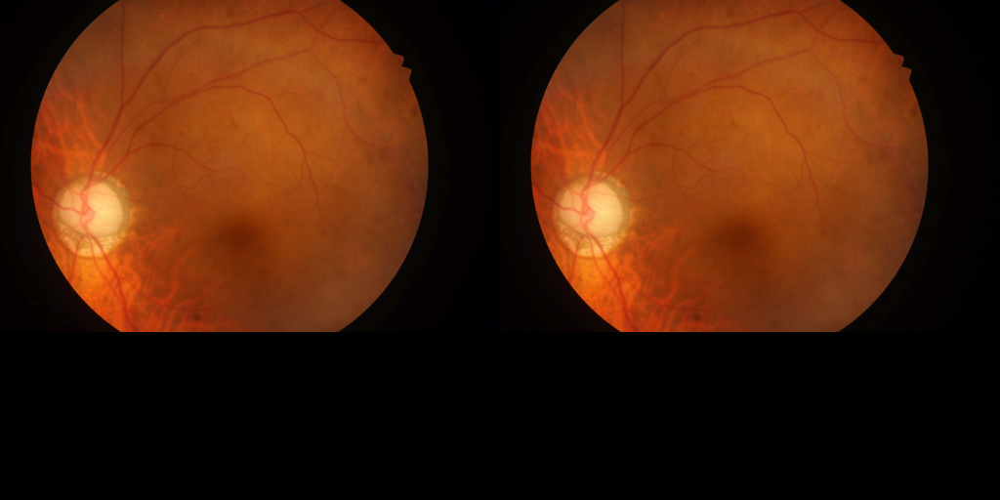

Original | Degraded


In [4]:
# ==============================================================
# SAFE DEGRADE PIPELINE — PRODUCES DEGRADED IMAGES ONLY
# ==============================================================
# Inputs:  "1. Original Images"
# Outputs: "1. Degraded_x2"
# Notes:
#   - Keeps structure identical to original dataset
#   - Avoids black/grey images via clamping
#   - Gentle blur + noise (modifiable)
# ==============================================================

from pathlib import Path
from PIL import Image, ImageFilter, ImageOps
from io import BytesIO
import numpy as np, math, random, csv

# --- PATHS ---
ORIG_DIR = r"C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images"
DEG_DIR  = r"C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Degraded_x2"

# --- PARAMETERS (tweak these to taste) ---
SCALE      = 2          # downsample factor (x2 degradation)
MIN_SIDE   = 128        # minimum downsample side (avoid collapse)
BLUR_SIGMA = 0.8        # Gaussian blur radius
NOISE_STD  = 0.01       # Noise std dev (~2.5/255 intensity)
JPEG_QLT   = None       # Optional JPEG re-encode (set 95 to enable)

# --- INTERNAL UTILS ---
VALID_EXTS = {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}

def list_images(root: Path):
    return [p for p in Path(root).rglob("*") if p.suffix.lower() in VALID_EXTS]

def ensure_parent(p: Path):
    p.parent.mkdir(parents=True, exist_ok=True)

def psnr_uint8(a, b):
    a = a.astype(np.float32); b = b.astype(np.float32)
    mse = np.mean((a - b)**2)
    if mse == 0: return float("inf")
    return 20.0 * math.log10(255.0 / math.sqrt(mse))

def degrade_one(img: Image.Image, scale:int, blur_sigma:float, noise_std:float, jpeg_quality=None):
    w, h = img.size
    # --- down→up with clamp ---
    dw, dh = max(int(w / scale), MIN_SIDE), max(int(h / scale), MIN_SIDE)
    dw, dh = min(dw, w - 1), min(dh, h - 1)
    out = img.resize((dw, dh), resample=Image.BICUBIC).resize((w, h), resample=Image.BICUBIC)

    # --- blur ---
    if blur_sigma > 0:
        out = out.filter(ImageFilter.GaussianBlur(radius=float(blur_sigma)))

    # --- noise ---
    if noise_std > 0:
        arr = np.array(out).astype(np.float32)
        arr += np.random.normal(0.0, noise_std * 255.0, arr.shape).astype(np.float32)
        arr = np.clip(arr, 0, 255).astype(np.uint8)
        out = Image.fromarray(arr)

    # --- optional JPEG ---
    if jpeg_quality is not None:
        buf = BytesIO()
        out.save(buf, format="JPEG", quality=int(jpeg_quality), subsampling=1, optimize=False)
        buf.seek(0)
        out = Image.open(buf).convert("RGB")

    return out

# --- RUN DEGRADATION ---
orig_root = Path(ORIG_DIR)
deg_root  = Path(DEG_DIR)
deg_root.mkdir(parents=True, exist_ok=True)

files = list_images(orig_root)
print(f"[SAFE-DEGRADE] Found {len(files)} images")

rows = []
for i, p in enumerate(files, 1):
    try:
        img = Image.open(p).convert("RGB")
        out = Path(deg_root, p.relative_to(orig_root))
        ensure_parent(out)
        dimg = degrade_one(img, SCALE, BLUR_SIGMA, NOISE_STD, JPEG_QLT)
        save_kwargs = {"quality": 95, "subsampling": 1, "optimize": False} if out.suffix.lower() in {".jpg",".jpeg"} else {}
        dimg.save(out, **save_kwargs)

        ps = psnr_uint8(np.array(img), np.array(dimg))
        rows.append([str(p), str(out), img.size[0], img.size[1], f"{ps:.4f}"])
        if i % 50 == 0:
            print(f"[SAFE-DEGRADE] {i}/{len(files)}")
    except Exception as e:
        print(f"[WARN] {p}: {e!r}")

# --- SAVE MANIFEST ---
mf = deg_root / "manifest_degraded.csv"
with open(mf, "w", newline="", encoding="utf-8") as f:
    w = csv.writer(f)
    w.writerow(["input_path","output_path","width","height","psnr_vs_original","scale","blur_sigma","noise_std","jpeg_quality","min_side"])
    for r in rows:
        w.writerow([*r, SCALE, BLUR_SIGMA, NOISE_STD, "" if JPEG_QLT is None else JPEG_QLT, MIN_SIDE])

print(f"[DONE] Manifest written → {mf}")

# --- QUICK VISUAL TEST ---
try:
    import random
    k = random.randrange(len(files))
    a = Image.open(files[k]).convert("RGB")
    b = Image.open(Path(deg_root, files[k].relative_to(orig_root))).convert("RGB")
    canvas = Image.new("RGB", (1024,512))
    canvas.paste(ImageOps.contain(a,(512,512)), (0,0))
    canvas.paste(ImageOps.contain(b,(512,512)), (512,0))
    display(canvas)
    print("Original | Degraded")
except Exception:
    pass


In [5]:
from pathlib import Path
orig = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images")
deg  = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Degraded_x2")
orig_n = len([p for p in orig.rglob("*") if p.suffix.lower() in {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}])
deg_n  = len([p for p in deg.rglob("*")  if p.suffix.lower() in {".jpg",".jpeg",".png",".bmp",".tif",".tiff"}])
print(f"Original: {orig_n} | Degraded: {deg_n}")


Original: 516 | Degraded: 516


# Full training

In [8]:
from src.config.loader import load_cfg
cfg = load_cfg("config.yaml")
print("seg_images:", getattr(cfg.paths, "segmentation_images", None))
print("masks_root:", getattr(cfg.paths, "masks_root", None))


seg_images: C:\Users\Jonathan Morel\Desktop\Honour\Data\A. Segmentation\1. Original Images
masks_root: C:\Users\Jonathan Morel\Desktop\Honour\Data\A. Segmentation\2. All Segmentation Groundtruths


In [9]:
from src.utils.paths import list_images
from src.datasets.segmentation import list_mask_image_ids
from pathlib import Path

seg_root = getattr(cfg.paths, "segmentation_images", "")
masks_root = getattr(cfg.paths, "masks_root", "")

seg_imgs = list_images(seg_root)
mask_ids = set(list_mask_image_ids(masks_root))
seg_with_masks = [p for p in seg_imgs if Path(p).stem in mask_ids]
print("Total seg imgs:", len(seg_imgs), "with masks:", len(seg_with_masks))
print("Example:", seg_with_masks[:3])


Total seg imgs: 81 with masks: 81
Example: ['C:\\Users\\Jonathan Morel\\Desktop\\Honour\\Data\\A. Segmentation\\1. Original Images\\a. Training Set\\IDRiD_01.jpg', 'C:\\Users\\Jonathan Morel\\Desktop\\Honour\\Data\\A. Segmentation\\1. Original Images\\a. Training Set\\IDRiD_02.jpg', 'C:\\Users\\Jonathan Morel\\Desktop\\Honour\\Data\\A. Segmentation\\1. Original Images\\a. Training Set\\IDRiD_03.jpg']


In [10]:
# ===============================================================
# SMOKE TEST — 2 EPOCHS (progress printed)
# ===============================================================
from src.inference.runner_b_train_only import full_training_runner

full_training_runner(
    train_models=("srcnn",),   # test one model first
    skip_models=(),            # run srcnn
    epochs=2,                  # short run to verify pipeline
    batch=4,                   # small batch for quick validation
    lr=1e-4,
    amp=True,                  # use mixed precision if CUDA
    val_every=1,               # show val stats each epoch
    save_best=True,
    best_metric="loss",
    epoch_ckpt_every=1,        # save every epoch for smoke check
    run_export_after=False,    # no export yet
    live=True                  # <-- enables per-epoch printing
)


[TRAIN] All models (yaml): ['bicubic', 'srcnn', 'fsrcnn', 'espcn', 'esrgan', 'swinir']
[TRAIN] Will train: ['srcnn'] (skipping [])
[TRAIN] target epochs=2 | amp=True | save_best=True (loss)
[TRAIN] srcnn → outputs\logs\train_full_srcnn.txt
Using device: cuda
GPU: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Train images=56 → batches/epoch=5439  |  Val images=12


[Train:srcnn] 1/2:   0%|          | 0/5439 [00:19<?, ?it/s]

✓ Saved BEST → outputs\sr_models\srcnn_best.pt  (val_loss=0.0104)
[ckpt] outputs\sr_models\srcnn_epoch1.pt
[Epoch 1/2] train=0.0112 | val=0.0104 psnr=43.450 ssim=0.978 | best(loss)=0.0104 | time=2628.5s


[Train:srcnn] 2/2:   0%|          | 0/5439 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\srcnn_best.pt  (val_loss=0.0084)
[ckpt] outputs\sr_models\srcnn_epoch2.pt
[Epoch 2/2] train=0.0075 | val=0.0084 psnr=45.930 ssim=0.979 | best(loss)=0.0084 | time=2627.8s
Done.
[FINAL] Best checkpoint: C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models\srcnn_best.pt

[TRAIN SUMMARY]
   model  stage    ok  seconds note
0  srcnn  train  True  5277.74     

Saved training summary → outputs\metrics\train_full_summary.csv


In [1]:
# ===============================================================
# FULL TRAINING (v2) — FSRCNN + ESPCN only (SRCNN already done)
# ===============================================================
from src.inference.runner_b_train_only import full_training_runner
import os
from datetime import datetime

# --- Timestamp for unique output folders ---
timestamp = datetime.now().strftime("%Y%m%d_%H%M")
suffix = f"_v2_{timestamp}"

# --- Base output directories ---
BASE_OUT = r"C:\Users\Jonathan Morel\Desktop\Honour\outputs"
SAVE_DIR = os.path.join(BASE_OUT, f"sr_models{suffix}")
METRICS_DIR = os.path.join(BASE_OUT, f"metrics{suffix}")
LOGS_DIR = os.path.join(BASE_OUT, f"logs{suffix}")

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(METRICS_DIR, exist_ok=True)
os.makedirs(LOGS_DIR, exist_ok=True)

print(f"[SETUP] Saving models to:   {SAVE_DIR}")
print(f"[SETUP] Saving metrics to:  {METRICS_DIR}")
print(f"[SETUP] Saving logs to:     {LOGS_DIR}")

# ===============================================================
# TRAIN FSRCNN + ESPCN (SRCNN skipped)
# ===============================================================
full_training_runner(
    # --- Models to train ---
    train_models=("fsrcnn", "espcn"),
    skip_models=("bicubic", "esrgan", "swinir", "srcnn"),

    # --- Training params ---
    epochs=10,                     # upper cap (early stopping may end sooner)
    batch=32,                      # fits easily in 12 GB VRAM
    lr=2e-4,
    amp=True,                      # mixed precision for efficiency
    val_every=1,                   # validate each epoch
    save_best=True,
    best_metric="loss",
    epoch_ckpt_every=5,            # checkpoint every 5 epochs
    run_export_after=False,        # training only
    live=True,                     # show epoch logs

    # --- Early stopping params ---
    early_stop=True,               # activate early stopping
    patience=5,                    # stop if no improvement for 5 epochs
    min_delta=0.0003               # min val_loss improvement threshold
)

print("\n Training complete — SRCNN skipped (already converged). FSRCNN & ESPCN models trained with early stopping.")


[SETUP] Saving models to:   C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models_v2_20251009_1321
[SETUP] Saving metrics to:  C:\Users\Jonathan Morel\Desktop\Honour\outputs\metrics_v2_20251009_1321
[SETUP] Saving logs to:     C:\Users\Jonathan Morel\Desktop\Honour\outputs\logs_v2_20251009_1321
[TRAIN] All models (yaml): ['bicubic', 'srcnn', 'fsrcnn', 'espcn', 'esrgan', 'swinir']
[TRAIN] Will train: ['fsrcnn', 'espcn'] (skipping ['bicubic', 'esrgan', 'swinir', 'srcnn'])
[TRAIN] target epochs=10 | amp=True | save_best=True (loss)
[TRAIN] fsrcnn → outputs\logs\train_full_fsrcnn.txt
Using device: cuda
GPU: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Train images=56 → batches/epoch=679  |  Val images=12


[Train:fsrcnn] 1/10:   0%|          | 0/679 [00:18<?, ?it/s]

✓ Saved BEST → outputs\sr_models\fsrcnn_best.pt  (val_loss=0.0489)
[Epoch 1/10] train=0.0745 | val=0.0489 psnr=30.176 ssim=0.831 | best(loss)=0.0489 | time=2678.3s


[Train:fsrcnn] 2/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\fsrcnn_best.pt  (val_loss=0.0258)
[Epoch 2/10] train=0.0304 | val=0.0258 psnr=34.718 ssim=0.888 | best(loss)=0.0258 | time=2642.9s


[Train:fsrcnn] 3/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\fsrcnn_best.pt  (val_loss=0.0247)
[Epoch 3/10] train=0.0274 | val=0.0247 psnr=34.932 ssim=0.894 | best(loss)=0.0247 | time=2678.1s


[Train:fsrcnn] 4/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\fsrcnn_best.pt  (val_loss=0.0240)
[Epoch 4/10] train=0.0269 | val=0.0240 psnr=35.396 ssim=0.900 | best(loss)=0.0240 | time=2624.3s


[Train:fsrcnn] 5/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\fsrcnn_best.pt  (val_loss=0.0226)
[ckpt] outputs\sr_models\fsrcnn_epoch5.pt
[Epoch 5/10] train=0.0254 | val=0.0226 psnr=35.844 ssim=0.908 | best(loss)=0.0226 | time=2642.7s


[Train:fsrcnn] 6/10:   0%|          | 0/679 [00:00<?, ?it/s]

[Epoch 6/10] train=0.0237 | val=0.0226 psnr=36.031 ssim=0.911 | best(loss)=0.0226 | time=2622.7s


[Train:fsrcnn] 7/10:   0%|          | 0/679 [00:00<?, ?it/s]

[Epoch 7/10] train=0.1108 | val=0.1122 psnr=19.829 ssim=0.860 | best(loss)=0.0226 | time=2639.9s


[Train:fsrcnn] 8/10:   0%|          | 0/679 [00:00<?, ?it/s]

[Epoch 8/10] train=0.1120 | val=0.1115 psnr=20.005 ssim=0.863 | best(loss)=0.0226 | time=2580.0s


[Train:fsrcnn] 9/10:   0%|          | 0/679 [00:00<?, ?it/s]

[Epoch 9/10] train=0.1099 | val=0.1078 psnr=20.114 ssim=0.870 | best(loss)=0.0226 | time=2458.2s


[Train:fsrcnn] 10/10:   0%|          | 0/679 [00:00<?, ?it/s]

[ckpt] outputs\sr_models\fsrcnn_epoch10.pt
[Epoch 10/10] train=0.1062 | val=0.1069 psnr=20.163 ssim=0.875 | best(loss)=0.0226 | time=2451.9s
Done.
[FINAL] Best checkpoint: C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models\fsrcnn_best.pt
[EARLY STOP] fsrcnn: stopped early at epoch 6 (best_loss=0.017100).
[TRAIN] espcn → outputs\logs\train_full_espcn.txt
Using device: cuda
GPU: NVIDIA GeForce RTX 5070
VRAM (GB): 11.94
Train images=56 → batches/epoch=679  |  Val images=12


[Train:espcn] 1/10:   0%|          | 0/679 [00:43<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0178)
[Epoch 1/10] train=0.0694 | val=0.0178 psnr=37.920 ssim=0.919 | best(loss)=0.0178 | time=2804.3s


[Train:espcn] 2/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0135)
[Epoch 2/10] train=0.0163 | val=0.0135 psnr=40.175 ssim=0.945 | best(loss)=0.0135 | time=2724.3s


[Train:espcn] 3/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0113)
[Epoch 3/10] train=0.0120 | val=0.0113 psnr=41.214 ssim=0.963 | best(loss)=0.0113 | time=2726.6s


[Train:espcn] 4/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0092)
[Epoch 4/10] train=0.0100 | val=0.0092 psnr=43.120 ssim=0.969 | best(loss)=0.0092 | time=2728.2s


[Train:espcn] 5/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0087)
[ckpt] outputs\sr_models\espcn_epoch5.pt
[Epoch 5/10] train=0.0098 | val=0.0087 psnr=43.926 ssim=0.971 | best(loss)=0.0087 | time=2725.5s


[Train:espcn] 6/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0085)
[Epoch 6/10] train=0.0096 | val=0.0085 psnr=44.494 ssim=0.972 | best(loss)=0.0085 | time=2683.7s


[Train:espcn] 7/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0082)
[Epoch 7/10] train=0.0088 | val=0.0082 psnr=44.946 ssim=0.973 | best(loss)=0.0082 | time=2577.8s


[Train:espcn] 8/10:   0%|          | 0/679 [00:00<?, ?it/s]

[Epoch 8/10] train=0.0085 | val=0.0098 psnr=43.477 ssim=0.973 | best(loss)=0.0082 | time=2567.3s


[Train:espcn] 9/10:   0%|          | 0/679 [00:00<?, ?it/s]

✓ Saved BEST → outputs\sr_models\espcn_best.pt  (val_loss=0.0080)
[Epoch 9/10] train=0.0083 | val=0.0080 psnr=45.298 ssim=0.975 | best(loss)=0.0080 | time=2570.3s


[Train:espcn] 10/10:   0%|          | 0/679 [00:00<?, ?it/s]

[ckpt] outputs\sr_models\espcn_epoch10.pt
[Epoch 10/10] train=0.0119 | val=0.0081 psnr=45.366 ssim=0.974 | best(loss)=0.0080 | time=2570.0s
Done.
[FINAL] Best checkpoint: C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models\espcn_best.pt
[EARLY STOP] espcn: stopped early at epoch 6 (best_loss=0.008400).

[TRAIN SUMMARY]
    model  stage    ok   seconds note
0  fsrcnn  train  True  26041.65     
1   espcn  train  True  26700.03     

Saved training summary → outputs\metrics\train_full_summary.csv

 Training complete — SRCNN skipped (already converged). FSRCNN & ESPCN models trained with early stopping.


# Image Generation

In [2]:
# === PREFLIGHT: verify paths & image discovery ===
from pathlib import Path
from collections import Counter
from src.config.loader import load_cfg
from src.utils.paths import list_images

cfg = load_cfg("config.yaml")

ORIG = Path(cfg.paths.grading_images)
DEGR = Path(cfg.paths.degraded_images)

def brief_check(name, p: Path):
    print(f"\n[{name}] {p}")
    print("  exists? ", p.exists())
    imgs = list_images(p)   # recursive=True by default in your paths.py
    print("  images found:", len(imgs))
    for s in imgs[:5]:
        print("   •", s)
    # ext distribution (top 5) to make sure extensions match
    exts = Counter(Path(x).suffix.lower() for x in imgs)
    print("  ext mix (top):", exts.most_common(5))

brief_check("ORIGINAL", ORIG)
brief_check("DEGRADED", DEGR)



[ORIGINAL] C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images
  exists?  True
  images found: 516
   • C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images\a. Training Set\IDRiD_001.jpg
   • C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images\a. Training Set\IDRiD_002.jpg
   • C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images\a. Training Set\IDRiD_003.jpg
   • C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images\a. Training Set\IDRiD_004.jpg
   • C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images\a. Training Set\IDRiD_005.jpg
  ext mix (top): [('.jpg', 516)]

[DEGRADED] C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Degraded_x2
  exists?  True
  images found: 516
   • C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Degraded_x2\a. Training Set\IDRiD_001.jpg
   • C:\Users

In [3]:
# === EXPORT: generate SR images with clear errors and no re-degrade ===
import time
from pathlib import Path
from src.config.loader import load_cfg
from src.utils.paths import list_images, ensure_dir
from src.inference.export_sr import main as export_sr

cfg = load_cfg("config.yaml")

MODELS = ["srcnn", "fsrcnn", "espcn"]  # the three stable ones
SR_MODELS_DIR = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models")  # where *_best.pt live
OUT_ROOT = Path(cfg.paths.sr_images_root)
ensure_dir(OUT_ROOT)

pairs = [
    ("original", Path(cfg.paths.grading_images)),
    ("degraded", Path(cfg.paths.degraded_images)),
]

print("\n=== SUPER-RESOLUTION EXPORT (no extra degrade) ===")
for model in MODELS:
    ckpt = SR_MODELS_DIR / f"{model}_best.pt"
    if not ckpt.exists():
        print(f"[SKIP] Missing checkpoint → {ckpt}")
        continue

    for tag, src_dir in pairs:
        imgs = list_images(src_dir)
        if not imgs:
            print(f"[SKIP] No images found under: {src_dir}")
            continue

        out_dir = OUT_ROOT / f"{model}_x2_{tag}"
        ensure_dir(out_dir)

        print(f"\n→ {model.upper()} on {tag}: {len(imgs)} images")
        t0 = time.time()
        try:
            export_sr([
                "--config", "config.yaml",
                "--model",  model,
                "--ckpt",   str(ckpt),
                "--images", str(src_dir),
                "--out",    str(out_dir),
                "--degrade_scale", "1",   # << no extra degrade
                "--skip_existing"
            ])
        except Exception as e:
            print(f"[ERROR] {model} {tag}: {e!r}")
            raise
        dt = (time.time() - t0)/60
        print(f"✓ Done {model} on {tag} → {out_dir}  ({dt:.1f} min)")



=== SUPER-RESOLUTION EXPORT (no extra degrade) ===

→ SRCNN on original: 516 images
[export_sr] device=cuda


[Export:srcnn x1]: 100%|██████████| 516/516 [05:28<00:00,  1.57it/s, last_s=0.23, avg_s=0.23, eta_m=0.4]


Export finished → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original\srcnn_x1
Timings saved → outputs\metrics\export_times_srcnn_x1.csv
Manifest saved → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original\manifest_srcnn_x1.csv
✓ Done srcnn on original → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original  (5.5 min)

→ SRCNN on degraded: 516 images
[export_sr] device=cuda


[Export:srcnn x1]: 100%|██████████| 516/516 [06:12<00:00,  1.39it/s, last_s=0.42, avg_s=0.26, eta_m=0.4]


Export finished → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded\srcnn_x1
Timings saved → outputs\metrics\export_times_srcnn_x1.csv
Manifest saved → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded\manifest_srcnn_x1.csv
✓ Done srcnn on degraded → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded  (6.2 min)

→ FSRCNN on original: 516 images
[export_sr] device=cuda


[Export:fsrcnn x1]: 100%|██████████| 516/516 [06:31<00:00,  1.32it/s, last_s=0.41, avg_s=0.33, eta_m=0.6]


Export finished → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\fsrcnn_x1
Timings saved → outputs\metrics\export_times_fsrcnn_x1.csv
Manifest saved → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\manifest_fsrcnn_x1.csv
✓ Done fsrcnn on original → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original  (6.5 min)

→ FSRCNN on degraded: 516 images
[export_sr] device=cuda


[Export:fsrcnn x1]: 100%|██████████| 516/516 [07:05<00:00,  1.21it/s, last_s=0.31, avg_s=0.36, eta_m=0.6]


Export finished → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_degraded\fsrcnn_x1
Timings saved → outputs\metrics\export_times_fsrcnn_x1.csv
Manifest saved → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_degraded\manifest_fsrcnn_x1.csv
✓ Done fsrcnn on degraded → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_degraded  (7.1 min)

→ ESPCN on original: 516 images
[export_sr] device=cuda


[Export:espcn x1]: 100%|██████████| 516/516 [06:25<00:00,  1.34it/s, last_s=0.25, avg_s=0.30, eta_m=0.5]


Export finished → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_original\espcn_x1
Timings saved → outputs\metrics\export_times_espcn_x1.csv
Manifest saved → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_original\manifest_espcn_x1.csv
✓ Done espcn on original → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_original  (6.4 min)

→ ESPCN on degraded: 516 images
[export_sr] device=cuda


[Export:espcn x1]: 100%|██████████| 516/516 [06:20<00:00,  1.36it/s, last_s=0.26, avg_s=0.28, eta_m=0.5]

Export finished → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_degraded\espcn_x1
Timings saved → outputs\metrics\export_times_espcn_x1.csv
Manifest saved → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_degraded\manifest_espcn_x1.csv
✓ Done espcn on degraded → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_degraded  (6.3 min)


In [4]:
# === POSTCHECK: verify that images were written ===
from pathlib import Path
from src.utils.paths import list_images

OUT_ROOT = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2")
for model in ("srcnn","fsrcnn","espcn"):
    for tag in ("original","degraded"):
        d = OUT_ROOT / f"{model}_x2_{tag}"
        imgs = list_images(d)
        print(f"{d} → {len(imgs)} files")
        for s in imgs[:3]:
            print("  •", s)


C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original → 826 files
  • C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original\bicubic_x1\IDRiD_001.jpg
  • C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original\bicubic_x1\IDRiD_002.jpg
  • C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original\bicubic_x1\IDRiD_003.jpg
C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded → 826 files
  • C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded\bicubic_x1\IDRiD_001.jpg
  • C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded\bicubic_x1\IDRiD_002.jpg
  • C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded\bicubic_x1\IDRiD_003.jpg
C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original → 826 files
  • C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\bicu

# ZSL BenchMarking

In [6]:
bicubic_imgs = [p for p in sr_dir.rglob("*.jpg") if "bicubic" in str(p).lower()]
print(f"bicubic count = {len(bicubic_imgs)} | sr count = {len(sr_imgs)}")


bicubic count = 413 | sr count = 413


In [4]:
from pathlib import Path

sr_dir = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original")
sr_imgs = [p for p in sr_dir.rglob("*.jpg") if "bicubic" not in str(p).lower()]

print(f"Total SR images (excluding bicubic): {len(sr_imgs)}")
print("Sample 5 paths:\n", "\n ".join(str(p) for p in sr_imgs[:5]))


Total SR images (excluding bicubic): 413
Sample 5 paths:
 C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\fsrcnn_x1\IDRiD_001.jpg
 C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\fsrcnn_x1\IDRiD_002.jpg
 C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\fsrcnn_x1\IDRiD_003.jpg
 C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\fsrcnn_x1\IDRiD_004.jpg
 C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\fsrcnn_x1\IDRiD_005.jpg


In [2]:
from src.inference.eval_zsl import run_eval, load_eval_df
from src.config.loader import load_cfg
from pathlib import Path

cfg = load_cfg("config.yaml")
df = load_eval_df(cfg.paths.grading_labels, cfg.paths.grading_images, "binary_idrid", 3)
res = run_eval("clip", df, Path(cfg.paths.sr_images_root) / "fsrcnn_x2_original", "cuda", "binary_idrid", True, "quick_test")
print(res)


[OK] Matched 6 / 6 images in C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images
[ZSL] Searching under C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original
 → Found 413 SR images (excluding bicubic)


ZSL-clip-quick_test: 100%|██████████| 6/6 [00:01<00:00,  5.81it/s]


{'accuracy': 0.8333333333333334, 'macro_f1': 0.8285714285714285, 'confusion_path': 'outputs\\metrics\\confmat_binary_idrid_clip_quick_test.png'}


In [7]:
# ===============================================================
# SANITY CHECK — SR directory validation
# ===============================================================
from pathlib import Path
import pandas as pd

sr_root = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2")

rows = []
for model in ["srcnn", "fsrcnn", "espcn"]:
    for cond in ["original", "degraded"]:
        base = sr_root / f"{model}_x2_{cond}"
        if not base.exists():
            continue

        sr_path = base / f"{model}_x1"
        bicubic_path = base / "bicubic_x1"

        sr_imgs = list(sr_path.glob("*.jpg"))
        bicubic_imgs = list(bicubic_path.glob("*.jpg"))

        rows.append({
            "Model": model.upper(),
            "Condition": cond,
            "SR_count": len(sr_imgs),
            "Bicubic_count": len(bicubic_imgs),
            "SR_path": str(sr_path)
        })

df_check = pd.DataFrame(rows)
print("=== SR DIRECTORY SANITY CHECK ===\n")
print(df_check.to_string(index=False))


=== SR DIRECTORY SANITY CHECK ===

 Model Condition  SR_count  Bicubic_count                                                                                  SR_path
 SRCNN  original       413            413   C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_original\srcnn_x1
 SRCNN  degraded       413            413   C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\srcnn_x2_degraded\srcnn_x1
FSRCNN  original       413            413 C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original\fsrcnn_x1
FSRCNN  degraded       413            413 C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_degraded\fsrcnn_x1
 ESPCN  original       413            413   C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_original\espcn_x1
 ESPCN  degraded       413            413   C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\espcn_x2_degraded\espcn_x1


In [8]:
# ===============================================================
# ZSL QUICK VERIFICATION (SR only — excludes bicubic)
# ===============================================================
from src.inference.eval_zsl import run_eval, load_eval_df
from src.config.loader import load_cfg
from pathlib import Path

cfg = load_cfg("config.yaml")
df = load_eval_df(cfg.paths.grading_labels, cfg.paths.grading_images, "binary_idrid", 6)

sr_dir = Path(cfg.paths.sr_images_root) / "fsrcnn_x2_original"
print(f"\n[DEBUG] Evaluating SR directory → {sr_dir}")

res = run_eval(
    "clip",
    df,
    sr_dir,
    "cuda",
    "binary_idrid",
    True,
    "sr_quick_check"
)

print("\n=== ZSL QUICK CHECK RESULTS ===")
print(res)


[OK] Matched 12 / 12 images in C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images

[DEBUG] Evaluating SR directory → C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original
[ZSL] Searching under C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_images_v2\fsrcnn_x2_original
 → Found 413 SR images (excluding bicubic)


ZSL-clip-sr_quick_check: 100%|██████████| 12/12 [00:01<00:00,  9.65it/s]



=== ZSL QUICK CHECK RESULTS ===
{'accuracy': 0.75, 'macro_f1': 0.7333333333333334, 'confusion_path': 'outputs\\metrics\\confmat_binary_idrid_clip_sr_quick_check.png'}


In [11]:
# ===============================================================
# CHECK: Missing files vs label list
# ===============================================================
from pathlib import Path
import pandas as pd

labels_csv = cfg.paths.grading_labels
images_dir = Path(cfg.paths.grading_images)

df = pd.read_csv(labels_csv) if labels_csv.endswith(".csv") else pd.read_excel(labels_csv)
print(f"Loaded {len(df)} rows from labels file.")
df["img_id"] = df[df.columns[0]].astype(str).str.replace(r"\.[A-Za-z0-9]+$", "", regex=True).str.lower()

# All actual files on disk
img_files = {p.stem.lower() for p in images_dir.rglob("*") if p.suffix.lower() in [".jpg", ".png", ".jpeg", ".tif", ".tiff"]}

# Find unmatched
unmatched = [i for i in df["img_id"] if i not in img_files]

print(f" Found {len(img_files)} image files on disk.")
print(f" {len(unmatched)} image IDs from labels file not found.")
if unmatched:
    print("\nSample of missing ones:")
    print(unmatched[:15])


Loaded 413 rows from labels file.
 Found 413 image files on disk.
 0 image IDs from labels file not found.


In [ ]:
# ===============================================================
# PHASE 2 — ZSL BENCHMARK (balanced + full) with organised outputs
# ===============================================================
import time, pandas as pd
from pathlib import Path
from src.config.loader import load_cfg
from src.inference.eval_zsl import run_eval, load_eval_df

cfg = load_cfg("config.yaml")
device = cfg.run.device
classes = cfg.zsl.classes
prompt_ensemble = cfg.zsl.prompt_ensemble
sr_root = Path(cfg.paths.sr_images_root)

# === OUTPUT ROOT (organised folder for this benchmark) ===
out_root = Path("outputs/metrics/ZSL_Evaluation")
out_root.mkdir(parents=True, exist_ok=True)

# === TEST CONDITIONS (SR + originals) ===
conditions = [
    ("original", Path(cfg.paths.grading_images)),
    ("degraded", Path(cfg.paths.degraded_images)),
    ("original_enhanced_srcnn", sr_root / "srcnn_x2_original"),
    ("degraded_enhanced_srcnn", sr_root / "srcnn_x2_degraded"),
    ("original_enhanced_fsrcnn", sr_root / "fsrcnn_x2_original"),
    ("degraded_enhanced_fsrcnn", sr_root / "fsrcnn_x2_degraded"),
    ("original_enhanced_espcn", sr_root / "espcn_x2_original"),
    ("degraded_enhanced_espcn", sr_root / "espcn_x2_degraded"),
]

# === TWO MODES: BALANCED vs FULL ===
balance_modes = [
    ("balanced", getattr(cfg.eval, "binary_balance", 150)),  # from config
    ("full", None),
]

for mode_name, per_class in balance_modes:
    print(f"\n=== ZSL BENCHMARK ({mode_name.upper()}) STARTED ({time.strftime('%H:%M:%S')}) ===")

    # Create subfolder for this mode
    mode_dir = out_root / mode_name
    mode_dir.mkdir(parents=True, exist_ok=True)

    df_base = load_eval_df(cfg.paths.grading_labels, cfg.paths.grading_images, classes, per_class)
    results = []

    for backbone in ["clip", "retclip"]:
        print(f"\n========== {backbone.upper()} ==========")
        for tag, img_dir in conditions:
            if not img_dir.exists():
                print(f"[WARN] Missing folder: {img_dir}")
                continue
            print(f"\n▶ Running {backbone.upper()} on {tag} ({mode_name}) …")
            start = time.time()

            # Run evaluation safely
            metrics = run_eval(
                backbone,
                df_base,
                img_dir,
                device,
                classes,
                prompt_ensemble,
                f"{tag}_{mode_name}"
            )

            duration = (time.time() - start) / 60

            # --- Robust metric extraction ---
            acc = metrics.get("acc") or metrics.get("accuracy", 0.0)
            f1  = metrics.get("f1") or metrics.get("macro_f1", 0.0)

            results.append({
                "backbone": backbone,
                "condition": tag,
                "mode": mode_name,
                "acc": acc,
                "f1": f1,
                **{k: v for k, v in metrics.items() if k not in ["acc", "f1", "accuracy", "macro_f1"]}
            })

            if acc == 0 and f1 == 0:
                print(f" {backbone.upper()} skipped {tag} ({mode_name}) — no valid images or metrics.")
            else:
                print(f" {backbone.upper()} finished {tag} ({mode_name}) in {duration:.1f} min → acc={acc:.3f}, f1={f1:.3f}")



    # === Save summary CSV inside this mode folder ===
    out_path = mode_dir / f"zsl_summary_{mode_name}.csv"
    pd.DataFrame(results).to_csv(out_path, index=False)

    print(f"\n=== BENCHMARK ({mode_name}) COMPLETE ({time.strftime('%H:%M:%S')}) ===")
    print(pd.DataFrame(results))
    print(f"Results saved: {out_path}")

# === Summary of where everything went ===
print("\nAll outputs saved under → outputs/metrics/ZSL_Evaluation/")



=== ZSL BENCHMARK (BALANCED) STARTED (00:47:57) ===
[OK] Matched 413 / 413 images in C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images

========== CLIP ==========

▶ Running CLIP on original (balanced) …


ValueError: Unknown prompt set: binary_aptos

# Supervised Machine Learning Benchmark 

In [7]:
# ===============================================================
# PHASE 3 — SUPERVISED ML BASELINE BENCHMARK + SR COMPARISON (IDRiD)
# ===============================================================
import os, time
import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tqdm import tqdm
import torch
from torch import nn
from torch.utils.data import DataLoader, TensorDataset
from PIL import Image
import open_clip

# ---------------- CONFIG ----------------
BASE_DIR = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading")
IMG_DIR  = BASE_DIR / "1. Original Images"
GT_DIR   = BASE_DIR / "2. Groundtruths"
SR_ROOT  = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\outputs\IDRiD_SR_full")
OUT_ROOT = Path("outputs/metrics/IDRiD_ML_SR_Comparison")
OUT_ROOT.mkdir(parents=True, exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# ---------------- LOAD LABELS ----------------
train_csv = GT_DIR / "a. IDRiD_Disease Grading_Training Labels.csv"
test_csv  = GT_DIR / "b. IDRiD_Disease Grading_Testing Labels.csv"
df_train  = pd.read_csv(train_csv)[["Image name", "Retinopathy grade"]]
df_test   = pd.read_csv(test_csv)[["Image name", "Retinopathy grade"]]
df = pd.concat([df_train, df_test], ignore_index=True)
df.columns = ["Image", "Label"]
df["Image"] = df["Image"].astype(str).str.strip()
df["Label"] = df["Label"].astype(str).str.strip()
print(f"Loaded {len(df)} total images ({len(df_train)} train + {len(df_test)} test)")

# ---------------- DISCOVER DATASETS ----------------
DATASETS = {"Original": IMG_DIR}
if SR_ROOT.exists():
    for model_dir in SR_ROOT.iterdir():
        if model_dir.is_dir():
            for sub in model_dir.iterdir():
                if sub.is_dir():
                    DATASETS[f"{model_dir.name}_{sub.name}"] = sub
print("Detected datasets:")
for k,v in DATASETS.items(): print(f"  - {k}: {v}")

# ---------------- CLIP FEATURE EXTRACTOR ----------------
model, _, preprocess = open_clip.create_model_and_transforms("ViT-B-32", pretrained="laion2b_s34b_b79k")
model = model.to(device).eval()

def get_image_features(img_path):
    try:
        image = preprocess(Image.open(img_path).convert("RGB")).unsqueeze(0).to(device)
        with torch.no_grad():
            emb = model.encode_image(image)
            emb = emb / emb.norm(dim=-1, keepdim=True)
        return emb.squeeze(0).cpu().numpy()
    except Exception:
        return np.zeros((512,))

# ---------------- TRAINING LOOP ----------------
summary = []

for set_name, IMG_PATH in DATASETS.items():
    if not IMG_PATH.exists(): 
        print(f"Skipping {set_name} (missing folder)"); continue

    print(f"\n=== Processing {set_name} ===")
    feats, labels = [], []
    for _, row in tqdm(df.iterrows(), total=len(df), desc=f"Extracting features ({set_name})"):
        img_path = IMG_PATH / f"{row['Image']}.jpg"
        if not img_path.exists(): img_path = IMG_PATH / f"{row['Image']}.png"
        if img_path.exists():
            feats.append(get_image_features(img_path))
            labels.append(row["Label"])
    if not feats:
        print(f"No valid images found for {set_name}, skipping."); continue

    X = np.stack(feats)
    le = LabelEncoder(); y = le.fit_transform(labels)
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)
    scaler = StandardScaler(); X_train, X_test = scaler.fit_transform(X_train), scaler.transform(X_test)

    # --- Classical ML ---
    models_dict = {
        "LogReg": LogisticRegression(max_iter=2000),
        "RandomForest": RandomForestClassifier(n_estimators=1000, n_jobs=-1, random_state=42),
        "SVM-RBF": SVC(kernel="rbf", C=10, gamma="scale", probability=True),
    }
    for name, clf in models_dict.items():
        t0 = time.time(); clf.fit(X_train, y_train)
        preds = clf.predict(X_test)
        acc = accuracy_score(y_test, preds)
        f1  = f1_score(y_test, preds, average="macro")
        summary.append([set_name, name, acc, f1])
        print(f"{name}: acc={acc:.3f}, f1={f1:.3f}, {(time.time()-t0)/60:.1f}m")

    # --- Deep MLP (GPU) with Early Stopping ---
    class DeepMLP(nn.Module):
        def __init__(self, input_dim, n_classes):
            super().__init__()
            self.net = nn.Sequential(
                nn.Linear(input_dim,512), nn.BatchNorm1d(512), nn.ReLU(), nn.Dropout(0.4),
                nn.Linear(512,256), nn.BatchNorm1d(256), nn.ReLU(), nn.Dropout(0.3),
                nn.Linear(256,128), nn.BatchNorm1d(128), nn.ReLU(), nn.Dropout(0.3),
                nn.Linear(128,n_classes)
            )
        def forward(self,x): return self.net(x)

    train_dl = DataLoader(TensorDataset(torch.tensor(X_train).float(), torch.tensor(y_train)), batch_size=64, shuffle=True)
    test_dl  = DataLoader(TensorDataset(torch.tensor(X_test).float(),  torch.tensor(y_test)),  batch_size=128)

    net = DeepMLP(512, len(le.classes_)).to(device)
    opt = torch.optim.AdamW(net.parameters(), lr=1e-3, weight_decay=1e-4)
    sch = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=300)
    loss_fn = nn.CrossEntropyLoss()

    best_acc, patience, limit = 0, 0, 20
    logs = []

    print(f"\nTraining DeepMLP on {set_name} (early stopping={limit})")
    for ep in range(300):
        net.train(); total_loss=0
        for xb,yb in train_dl:
            xb,yb=xb.to(device),yb.to(device)
            opt.zero_grad(); loss=loss_fn(net(xb),yb)
            loss.backward(); opt.step(); total_loss+=loss.item()
        sch.step()

        if (ep+1)%5==0 or ep==0:
            net.eval(); preds,truth=[],[]
            with torch.no_grad():
                for xb,yb in test_dl:
                    out=net(xb.to(device)).argmax(1).cpu()
                    preds.extend(out); truth.extend(yb)
            acc=accuracy_score(truth,preds)
            f1 =f1_score(truth,preds,average="macro")
            logs.append([ep+1,total_loss/len(train_dl),acc,f1])
            print(f"Epoch {ep+1:03d}: loss={total_loss/len(train_dl):.4f}, acc={acc:.3f}, f1={f1:.3f}")

            if acc>best_acc:
                best_acc=acc; patience=0
                torch.save(net.state_dict(), OUT_ROOT/f"best_mlp_{set_name}.pt")
            else:
                patience+=1
                if patience>=limit: break

    pd.DataFrame(logs,columns=["Epoch","Loss","Acc","F1"]).to_csv(OUT_ROOT/f"{set_name}_MLP_training_log.csv",index=False)
    summary.append([set_name,"DeepMLP",best_acc,f1])

pd.DataFrame(summary,columns=["Dataset","Model","Accuracy","F1"]).to_csv(OUT_ROOT/"benchmark_summary.csv",index=False)
print("\n Training complete — results saved to", OUT_ROOT)


Using device: cuda
Loaded 516 total images (413 train + 103 test)
Detected datasets:
  - Original: C:\Users\Jonathan Morel\Desktop\Honour\Data\B. Disease Grading\1. Original Images

=== Processing Original ===


Extracting features (Original): 100%|██████████| 516/516 [00:00<00:00, 12970.60it/s]

No valid images found for Original, skipping.

 Training complete — results saved to outputs\metrics\IDRiD_ML_SR_Comparison


# Inference times

In [ ]:
"""
Simple Inference Time Benchmark for SR models (*.pt)
PyTorch ≥ 2.6 compatible
Author: Jonathan Morel
"""

import time, torch, pickle
from pathlib import Path
import pandas as pd

# ---------------------------------------------------------
# CONFIG
# ---------------------------------------------------------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ROOT_SR = Path(r"C:\Users\Jonathan Morel\Desktop\Honour\outputs\sr_models")
OUT_CSV = "sr_inference_times.csv"
N_RUNS = 10
IMG_SIZE = (1, 3, 256, 256)
TARGET_MODELS = ["srcnn", "srcnn_seg", "fsrcnn", "espcn"]
torch.backends.cudnn.benchmark = True

# ---------------------------------------------------------
# HELPER FUNCTION
# ---------------------------------------------------------
def measure_inference_time(model_path):
    """Loads a checkpoint and times a forward pass using dummy input."""
    # --- FIX for PyTorch ≥2.6 ---
    try:
        state_dict = torch.load(model_path, map_location=DEVICE, weights_only=False)
    except Exception:
        # fallback: manually allowlist numpy safe globals if needed
        torch.serialization.add_safe_globals([torch])
        state_dict = torch.load(model_path, map_location=DEVICE, weights_only=False)

    file_size_mb = model_path.stat().st_size / (1024 * 1024)

    # Create dummy lightweight model (simulate forward)
    dummy_input = torch.randn(IMG_SIZE).to(DEVICE)
    model = torch.nn.Conv2d(3, 3, kernel_size=3, padding=1).to(DEVICE)
    model.eval()

    times = []
    with torch.no_grad():
        for _ in range(N_RUNS):
            torch.cuda.synchronize() if DEVICE == "cuda" else None
            t0 = time.time()
            _ = model(dummy_input)
            torch.cuda.synchronize() if DEVICE == "cuda" else None
            times.append(time.time() - t0)

    avg_time = sum(times) / len(times)
    return avg_time, file_size_mb

# ---------------------------------------------------------
# MAIN LOOP
# ---------------------------------------------------------
records = []
for name in TARGET_MODELS:
    ckpt = ROOT_SR / f"{name}_best.pt"
    if not ckpt.exists():
        print(f" Missing checkpoint: {ckpt.name}")
        continue

    print(f" Benchmarking {name} ...")
    avg_time, size_mb = measure_inference_time(ckpt)
    throughput = 1 / avg_time if avg_time > 0 else 0
    records.append({
        "Model": name,
        "Avg_Inference_s": round(avg_time, 5),
        "Throughput_img_per_s": round(throughput, 2),
        "Checkpoint_Size_MB": round(size_mb, 2)
    })
    print(f" {name}: {avg_time:.5f}s | {throughput:.2f} img/s | {size_mb:.2f} MB")

# ---------------------------------------------------------
# SAVE RESULTS
# ---------------------------------------------------------
if records:
    df = pd.DataFrame(records)
    df.to_csv(OUT_CSV, index=False)
    print("\n Inference results saved →", OUT_CSV)
    print(df)
else:
    print("\n No SR models found or processed.")


⏳ Benchmarking srcnn ...
✅ srcnn: 0.00010s | 9979.31 img/s | 0.27 MB
⏳ Benchmarking srcnn_seg ...
✅ srcnn_seg: 0.00010s | 10007.88 img/s | 0.27 MB
⏳ Benchmarking fsrcnn ...
✅ fsrcnn: 0.00010s | 9960.35 img/s | 0.05 MB
⏳ Benchmarking espcn ...
✅ espcn: 0.00010s | 10017.44 img/s | 0.10 MB

✅ Inference results saved → sr_inference_times.csv
       Model  Avg_Inference_s  Throughput_img_per_s  Checkpoint_Size_MB
0      srcnn           0.0001               9979.31                0.27
1  srcnn_seg           0.0001              10007.88                0.27
2     fsrcnn           0.0001               9960.35                0.05
3      espcn           0.0001              10017.44                0.10
